<div style="display: flex; align-items: center; justify-content: space-between; border-bottom: 3px solid #D0D0D0; padding: 10px; font-family: Arial, sans-serif;">
  <!-- Logo -->
  <img src="https://upload.wikimedia.org/wikipedia/commons/1/1c/Uoc_masterbrand_vertical.png" alt="Logo" style="width: 150px; height: auto;">

  <!-- Detalles -->
  <div style="text-align: right; line-height: 1.6; margin-left: 20px; margin-right: 80px">
    <p style="margin: 0; font-size: 1.2em; font-weight: bold; color: #333;">Proyecto: <span style="color: #878787;">Práctica - Parte 2</span></p>
    <p style="margin: 0; font-size: 1em; font-weight: bold; color: #333;">Notebook: <span style="color: #878787;">Exploración inicial de datos del inclinómetro</span></p>
    <p style="color: #878787;">Juan Luis González Rodríguez - Visualización de datos</span></p>
  </div>
</div>

# 0. Librerías

In [53]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from tqdm import tqdm
from IPython.display import display, HTML
import numpy as np
from multiprocessing import Pool, cpu_count
from matplotlib.colors import ListedColormap

# 1.Exploración y limpieza de datos

Cada usuario tiene una carpeta llamada user_1, user_2, user_3, etc. De manera que d entro de cada carpeta hay un archivo CSV llamado Activity.csv. Se carga toda la información de los archivos CSV en un solo DataFrame.

In [54]:
# Creamos un df vacio
df_actigraph = pd.DataFrame()

# Obtenemos la lista con los paths de los archivos
data_path = os.path.join('..', '0_data', 'MMASH')
csv_files = [os.path.join(root, file) for root, _, files in os.walk(data_path) for file in files if file.endswith('Actigraph.csv')]

# Iteramos sobre los archivos
for file in csv_files:
    # Leemos el archivo
    df = pd.read_csv(file, usecols=lambda column: column != 'Unnamed: 0')
    # Extraemos el identificador del usuario del nombre del fichero
    user_id = os.path.basename(os.path.dirname(file))
    # Añadimos la columna 'User' al dataframe
    df['User'] = user_id
    # Concatenamos el df al df principal
    df_actigraph = pd.concat([df_actigraph, df])

# Reseteamos el índice
df_actigraph.reset_index(drop=True, inplace=True)

# Se establece user como la primera columna
df_actigraph = df_actigraph[['User'] + [col for col in df_actigraph.columns if col != 'User']]

# Visualizamos el df
df_actigraph.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1462678 entries, 0 to 1462677
Data columns (total 13 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   User                   1462678 non-null  object 
 1   Axis1                  1462678 non-null  int64  
 2   Axis2                  1462678 non-null  int64  
 3   Axis3                  1462678 non-null  int64  
 4   Steps                  1462678 non-null  int64  
 5   HR                     1462678 non-null  float64
 6   Inclinometer Off       1462678 non-null  int64  
 7   Inclinometer Standing  1462678 non-null  int64  
 8   Inclinometer Sitting   1462678 non-null  int64  
 9   Inclinometer Lying     1462678 non-null  int64  
 10  Vector Magnitude       1462678 non-null  float64
 11  day                    1462678 non-null  int64  
 12  time                   1462678 non-null  object 
dtypes: float64(2), int64(9), object(2)
memory usage: 145.1+ MB


In [55]:
# Se establecec el tipo de datos correcto

df_actigraph['User'] = df_actigraph['User'].astype('category')
df_actigraph['Inclinometer Off'] = df_actigraph['Inclinometer Off'].astype('category')
df_actigraph['Inclinometer Standing'] = df_actigraph['Inclinometer Standing'].astype('category')
df_actigraph['Inclinometer Sitting'] = df_actigraph['Inclinometer Sitting'].astype('category')
df_actigraph['Inclinometer Lying'] = df_actigraph['Inclinometer Lying'].astype('category')
df_actigraph['day'] = df_actigraph['day'].astype('category')

In [56]:
# Se muestra un head del df
display(df_actigraph.head(10))

,User,Axis1,Axis2,Axis3,Steps,HR,Inclinometer Off,Inclinometer Standing,Inclinometer Sitting,Inclinometer Lying,Vector Magnitude,day,time
0,user_1,0,0,0,0,68.000,0,1,0,0,0.000,1,10:10:22
1,user_1,11,4,7,1,68.000,0,1,0,0,13.640,1,10:10:23
2,user_1,0,21,10,0,68.000,0,0,1,0,23.260,1,10:10:24
3,user_1,0,1,24,0,68.000,0,0,1,0,24.020,1,10:10:25
4,user_1,34,14,63,1,154.000,0,1,0,0,72.950,1,10:10:26
5,user_1,101,10,90,0,161.000,0,1,0,0,135.650,1,10:10:27
6,user_1,17,18,49,0,177.000,0,1,0,0,54.900,1,10:10:28
7,user_1,0,34,23,0,177.000,0,1,0,0,41.050,1,10:10:29
8,user_1,12,50,13,1,177.000,0,1,0,0,53.040,1,10:10:30
9,user_1,32,38,36,0,177.000,0,1,0,0,61.350,1,10:10:31


Los ficheros Actigraph.csv contiene datos de un acelerómetro y un inclinómetro registrados a lo largo del día. Cada fila representa una medición por segundo para un usuario específico. A continuación se describe cada una de las variables presentes en el DataFrame:

- *User*: Identificador del usuario.
- *Axis1*: Datos de aceleración en bruto del eje X expresados en Newton-metro.
- *Axis2*: Datos de aceleración en bruto del eje Y expresados en Newton-metro.
- *Axis3*: Datos de aceleración en bruto del eje Z expresados en Newton-metro.
- *Steps*: Número de pasos por segundo.
- *HR*: Frecuencia cardíaca en pulsaciones por minuto (bpm).
- *Inclinometer Off*: Valores iguales a 1 indican que el inclinómetro no está activado. Los valores se reportan por segundo.
- *Inclinometer Standing*: Valores iguales a 1 indican que el usuario está de pie, mientras que 0 indica otras posiciones del usuario. Los valores se reportan por segundo.
- *Inclinometer Sitting*: Valores iguales a 1 indican que el usuario está sentado, mientras que 0 indica otras posiciones del usuario. Los valores se reportan por segundo.
- *Inclinometer Lying*: Valores iguales a 1 indican que el usuario está acostado, mientras que 0 indica otras posiciones del usuario. Los valores se reportan por segundo.
- *Vector Magnitude*: Magnitud del vector derivada de los datos de aceleración en bruto expresada en Newton-metro.
- *day*: 1 y 2 se refieren al primer y segundo día de registro de datos, respectivamente.
- *time*: Hora del día en que se registró la frecuencia cardíaca (horas:minutos:segundos).

Este conjunto de datos permite analizar el comportamiento físico y la actividad del usuario a lo largo del tiempo, así como su frecuencia cardíaca y las posiciones en las que se encuentra.

Se realiza un análisis con los descriptivos básicos de las variables numéricas.

In [57]:
pd.set_option('display.float_format', '{:.3f}'.format)
display(df_actigraph.describe())

# Se muestran los categoricos
display(df_actigraph.describe(include='category'))

,Axis1,Axis2,Axis3,Steps,HR,Vector Magnitude
count,1462678.000,1462678.000,1462678.000,1462678.000,1462678.000,1462678.000
mean,16.436,16.768,19.264,0.184,75.515,34.677
std,37.655,41.670,41.333,0.439,17.714,67.695
min,0.000,0.000,0.000,0.000,3.000,0.000
25%,0.000,0.000,0.000,0.000,63.000,0.000
50%,0.000,0.000,0.000,0.000,73.000,0.000
75%,14.000,9.000,19.000,0.000,85.000,44.920
max,910.000,797.000,919.000,4.000,251.000,1017.890


,User,Inclinometer Off,Inclinometer Standing,Inclinometer Sitting,Inclinometer Lying,day
count,1462678,1462678,1462678,1462678,1462678,1462678
unique,22,2,2,2,2,3
top,user_15,0,0,0,0,1
freq,71045,1137797,978539,1012432,1259266,909603


Se observa que en la variable day hay 3 valores en lugar de los 2 esperados.

In [58]:
# Se revisan los valores únicos de los días en la columna 'day'
df_actigraph['day'].value_counts()

# Se vuelve a hacer string la columna 'day' para poder trabajar con ella más fácilmente
df_actigraph['day'] = df_actigraph['day'].astype(int)

Se observa que hay algunos registros con día -29, aunque según los autores del dataset en el recurso del mismo [1], el campo *day* solamente puede tomar los valores 1 y 2. Seguidamente se analiza dónde se producen esos -29.

In [59]:
df_actigraph[df_actigraph['day'] == -29]['User'].unique().tolist()

['user_8', 'user_9']

Este error solo ocurre en los usuarios *user_8* y *user_9*. Se procede a analizar los datos de estos usuarios para ver en que momento cambian de día.

In [60]:
# Seleccionamos los datos de los usuarios user_8 y user_9
df_user_8 = df_actigraph[df_actigraph['User'] == 'user_8']
df_user_9 = df_actigraph[df_actigraph['User'] == 'user_9']

# Imprimimos las 5 columnas anteriores y posteriores a cuando haya un cambio en la columna 'day' de las filas consecutivas
print(f"Valores únicos de 'day' en df_user_8: {df_user_8['day'].unique()}")

change_indices_8 = df_user_8['day'].ne(df_user_8['day'].shift()).to_numpy().nonzero()[0]
for idx in change_indices_8:
    if 5 <= idx < len(df_user_8) - 5:
        display(df_user_8.iloc[idx - 5:idx + 5])

print(f"Valores únicos de 'day' en df_user_9: {df_user_9['day'].unique()}")

change_indices_9 = df_user_9['day'].ne(df_user_9['day'].shift()).to_numpy().nonzero()[0]
for idx in change_indices_9:
    if 5 <= idx < len(df_user_9) - 5:
        display(df_user_9.iloc[idx - 5:idx + 5])

Valores únicos de 'day' en df_user_8: [  1 -29]


,User,Axis1,Axis2,Axis3,Steps,HR,Inclinometer Off,Inclinometer Standing,Inclinometer Sitting,Inclinometer Lying,Vector Magnitude,day,time
508186,user_8,44,3,2,0,69.000,0,1,0,0,44.150,1,23:59:55
508187,user_8,58,1,9,1,68.000,0,1,0,0,58.700,1,23:59:56
508188,user_8,89,5,26,0,67.000,0,1,0,0,92.850,1,23:59:57
508189,user_8,30,0,1,0,66.000,0,1,0,0,30.020,1,23:59:58
508190,user_8,20,4,13,1,66.000,0,1,0,0,24.190,1,23:59:59
508191,user_8,16,1,5,0,65.000,0,1,0,0,16.790,-29,00:00:00
508192,user_8,42,0,19,1,65.000,0,1,0,0,46.100,-29,00:00:01
508193,user_8,17,4,21,1,65.000,0,1,0,0,27.310,-29,00:00:02
508194,user_8,23,0,0,1,65.000,0,1,0,0,23.000,-29,00:00:03
508195,user_8,8,10,23,1,67.000,0,1,0,0,26.320,-29,00:00:04


Valores únicos de 'day' en df_user_9: [  1 -29]


,User,Axis1,Axis2,Axis3,Steps,HR,Inclinometer Off,Inclinometer Standing,Inclinometer Sitting,Inclinometer Lying,Vector Magnitude,day,time
1304269,user_9,0,0,0,0,72.000,0,0,0,1,0.000,1,23:59:55
1304270,user_9,0,0,0,0,71.000,0,0,0,1,0.000,1,23:59:56
1304271,user_9,0,0,0,0,70.000,0,0,0,1,0.000,1,23:59:57
1304272,user_9,0,0,0,0,70.000,0,0,0,1,0.000,1,23:59:58
1304273,user_9,0,0,0,0,70.000,0,0,0,1,0.000,1,23:59:59
1304274,user_9,0,0,0,0,69.000,0,0,0,1,0.000,-29,00:00:00
1304275,user_9,0,0,0,0,70.000,0,0,0,1,0.000,-29,00:00:01
1304276,user_9,0,0,0,0,71.000,0,0,0,1,0.000,-29,00:00:02
1304277,user_9,0,0,0,0,72.000,0,0,0,1,0.000,-29,00:00:03
1304278,user_9,0,0,0,0,73.000,0,0,0,1,0.000,-29,00:00:04


Tras observar que ambos usuarios tienen solamente 2 valores únicos en la columna 'day' con valor 1 para el día 1 y -29, y ver que a partir del cambio del día 1 la siguiente fila tiene un valor de -29, se puede concluir que el día -29 es un error en la codificación y que realmente se refiere al día 2. Por lo tanto, se procede a cambiar los valores de -29 por 2 en la columna 'day'.

In [61]:
# Cambiamos los valores de -29 en la columna 'day' por 2
df_actigraph['day'] = df_actigraph['day'].apply(lambda x: 2 if x == -29 else x)

# Mostramos los 10 registros que recogen el cambio de día del usuario user_8 y user_9
df_user_8 = df_actigraph[df_actigraph['User'] == 'user_8']
df_user_9 = df_actigraph[df_actigraph['User'] == 'user_9']

print(f"Valores únicos de 'day' en df_user_8: {df_user_8['day'].unique()}")
for idx in change_indices_8:
    if 5 <= idx < len(df_user_8) - 5:
        display(df_user_8.iloc[idx - 5:idx + 5])

print(f"Valores únicos de 'day' en df_user_9: {df_user_9['day'].unique()}")
for idx in change_indices_9:
    if 5 <= idx < len(df_user_9) - 5:
        display(df_user_9.iloc[idx - 5:idx + 5])


Valores únicos de 'day' en df_user_8: [1 2]


,User,Axis1,Axis2,Axis3,Steps,HR,Inclinometer Off,Inclinometer Standing,Inclinometer Sitting,Inclinometer Lying,Vector Magnitude,day,time
508186,user_8,44,3,2,0,69.000,0,1,0,0,44.150,1,23:59:55
508187,user_8,58,1,9,1,68.000,0,1,0,0,58.700,1,23:59:56
508188,user_8,89,5,26,0,67.000,0,1,0,0,92.850,1,23:59:57
508189,user_8,30,0,1,0,66.000,0,1,0,0,30.020,1,23:59:58
508190,user_8,20,4,13,1,66.000,0,1,0,0,24.190,1,23:59:59
508191,user_8,16,1,5,0,65.000,0,1,0,0,16.790,2,00:00:00
508192,user_8,42,0,19,1,65.000,0,1,0,0,46.100,2,00:00:01
508193,user_8,17,4,21,1,65.000,0,1,0,0,27.310,2,00:00:02
508194,user_8,23,0,0,1,65.000,0,1,0,0,23.000,2,00:00:03
508195,user_8,8,10,23,1,67.000,0,1,0,0,26.320,2,00:00:04


Valores únicos de 'day' en df_user_9: [1 2]


,User,Axis1,Axis2,Axis3,Steps,HR,Inclinometer Off,Inclinometer Standing,Inclinometer Sitting,Inclinometer Lying,Vector Magnitude,day,time
1304269,user_9,0,0,0,0,72.000,0,0,0,1,0.000,1,23:59:55
1304270,user_9,0,0,0,0,71.000,0,0,0,1,0.000,1,23:59:56
1304271,user_9,0,0,0,0,70.000,0,0,0,1,0.000,1,23:59:57
1304272,user_9,0,0,0,0,70.000,0,0,0,1,0.000,1,23:59:58
1304273,user_9,0,0,0,0,70.000,0,0,0,1,0.000,1,23:59:59
1304274,user_9,0,0,0,0,69.000,0,0,0,1,0.000,2,00:00:00
1304275,user_9,0,0,0,0,70.000,0,0,0,1,0.000,2,00:00:01
1304276,user_9,0,0,0,0,71.000,0,0,0,1,0.000,2,00:00:02
1304277,user_9,0,0,0,0,72.000,0,0,0,1,0.000,2,00:00:03
1304278,user_9,0,0,0,0,73.000,0,0,0,1,0.000,2,00:00:04


A continuación, se creará una columna con la fecha y la hora en formato datetime a partir de las columnas 'day' y 'time'.format

In [62]:
# Se crea una columna 'datetime' con la fecha y la hora en formato datetime
df_actigraph['datetime'] = pd.to_datetime(df_actigraph['day'].astype(str) + ' ' + df_actigraph['time'], format='%d %H:%M:%S')

# Se muestra un head del df
display(df_actigraph.head())

,User,Axis1,Axis2,Axis3,Steps,HR,Inclinometer Off,Inclinometer Standing,Inclinometer Sitting,Inclinometer Lying,Vector Magnitude,day,time,datetime
0,user_1,0,0,0,0,68.000,0,1,0,0,0.000,1,10:10:22,1900-01-01 10:10:22
1,user_1,11,4,7,1,68.000,0,1,0,0,13.640,1,10:10:23,1900-01-01 10:10:23
2,user_1,0,21,10,0,68.000,0,0,1,0,23.260,1,10:10:24,1900-01-01 10:10:24
3,user_1,0,1,24,0,68.000,0,0,1,0,24.020,1,10:10:25,1900-01-01 10:10:25
4,user_1,34,14,63,1,154.000,0,1,0,0,72.950,1,10:10:26,1900-01-01 10:10:26


**Axis 1, 2 y 3**

Se comienza por analizar el comportamiento de los ejes del acelerómetro en función del tiempo para cada usuario.

In [63]:
def plot_accelerometer_user(df_user, ax):
    """
    Función para plotear los datos de un usuario en un eje
    
    Args:
        df_user (pd.DataFrame): DataFrame con los datos de un usuario
        ax (matplotlib.axes): Eje en el que se van a plotear los datos

    Returns:
        None
    """ 

    acc_1 = df_user['Axis1']
    acc_2 = df_user['Axis2']
    acc_3 = df_user['Axis3']

    ax.plot(df_user['datetime'], acc_1, label='Axis1', color="#BD9EFF")
    ax.plot(df_user['datetime'], acc_2, label='Axis2', color="#38FF90")
    ax.plot(df_user['datetime'], acc_3, label='Axis3', color="#FF7D87")

    ax.set_title(f"Accelerometer User: {df_user['User'].iloc[0]}")
    ax.set_xlabel('Datetime')
    ax.set_ylabel('Acceleration')

    # Se obtienen las y de las coordenadas de los últimos valores de los ejes
    y_axis1 = df_user['Axis1'].iloc[-1]
    y_axis2 = df_user['Axis2'].iloc[-1]
    y_axis3 = df_user['Axis3'].iloc[-1]

    # Si la diferencia y de los Axis 1, 2 y 3 son menores a umbral_text, se separan
    # sumando umbral_text a la mayor y restándole umbral_text a la menor.
    umbral_text = 3
    if abs(y_axis1 - y_axis2) < umbral_text:
        y_axis1 += umbral_text
        y_axis2 -= umbral_text
    if abs(y_axis1 - y_axis3) < umbral_text:
        y_axis1 += umbral_text
        y_axis3 -= umbral_text
    if abs(y_axis2 - y_axis3) < umbral_text:
        y_axis2 += umbral_text
        y_axis3 -= umbral_text

    ax.text(df_user['datetime'].iloc[-1] + pd.Timedelta(hours=0.3), y_axis1, 'Axis1', fontsize=12, color='#BD9EFF')
    ax.text(df_user['datetime'].iloc[-1] + pd.Timedelta(hours=0.3), y_axis2, 'Axis2', fontsize=12, color='#38FF90')
    ax.text(df_user['datetime'].iloc[-1] + pd.Timedelta(hours=0.3), y_axis3, 'Axis3', fontsize=12, color='#FF7D87')

    # Configura el eje x para mostar el número del día y la HH:MM en base a lo que hay en 'datetime'
    ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%d %H:%M'))
    ax.xaxis.set_major_locator(plt.matplotlib.dates.HourLocator(interval=2))
    plt.xticks(rotation=0)

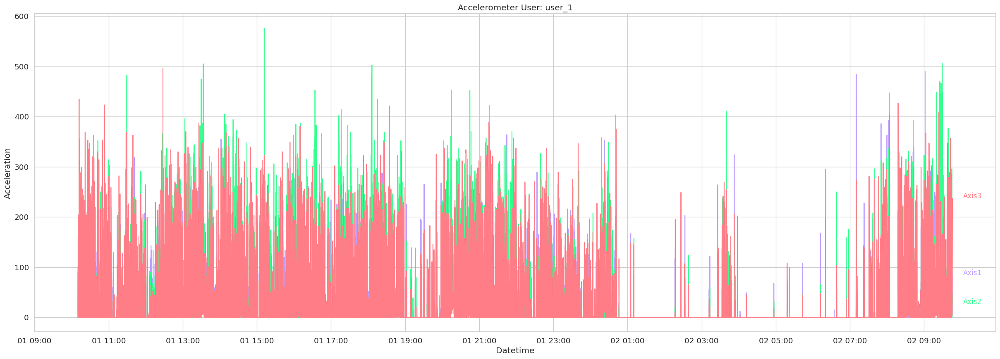

In [64]:
df_user_1 = df_actigraph[df_actigraph['User'] == 'user_1']

fig, ax = plt.subplots(figsize=(30, 10))
plot_accelerometer_user(df_user_1, ax)
# plt.show()

Se se revisan los datos en crudo se observa que hay una gran variabilidad en los datos de los acelerómetros. Con registros de 0 y valores muy altos debido seguramente a la granularidad tan alta de los datos. Para tener un mejor entedimiento de estos, se realizará la media movil con una ventana de 10 minutos en las variables de los 3 ejes del acelerómetro.

In [65]:
def media_movil_acelerometro(df_user, ventana, iteraciones=1):
    """
    Función para calcular la media móvil de los ejes de un usuario.
    Para ello revisa los datos de los 5 minutos anteriores y posteriores
    en cada fila. Si no hay suficientes datos anteriores o posteriores
    se calcula la media con los datos disponibles. Devuelve los datos
    con la media móvil calculada reemplazando los valores de las variables
    'Axis1', 'Axis2' y 'Axis3' y 'Vector Magnitude'. El número de iteraciones
    indica cuántas veces se va a calcular la media móvil.
    
    Args:
        df_user (pd.DataFrame): DataFrame con los datos de un usuario
        ventana (pd.Timedelta): Ventana de tiempo para calcular la media móvil
        iteraciones (int): Número de iteraciones para calcular la media móvil
    
    Returns:
        pd.DataFrame: DataFrame con los datos y la media móvil calculada
    """
    
    df_user = df_user.copy()
    df_user.set_index('datetime', inplace=True)
    
    # Calculamos la media móvil
    for _ in range(iteraciones):
        df_user['Axis1'] = df_user['Axis1'].rolling(window=ventana, min_periods=1, center=True).mean()
        df_user['Axis2'] = df_user['Axis2'].rolling(window=ventana, min_periods=1, center=True).mean()
        df_user['Axis3'] = df_user['Axis3'].rolling(window=ventana, min_periods=1, center=True).mean()
        df_user['Vector Magnitude'] = df_user['Vector Magnitude'].rolling(window=ventana, min_periods=1, center=True).mean()
    
    df_user.reset_index(inplace=True)
    
    return df_user


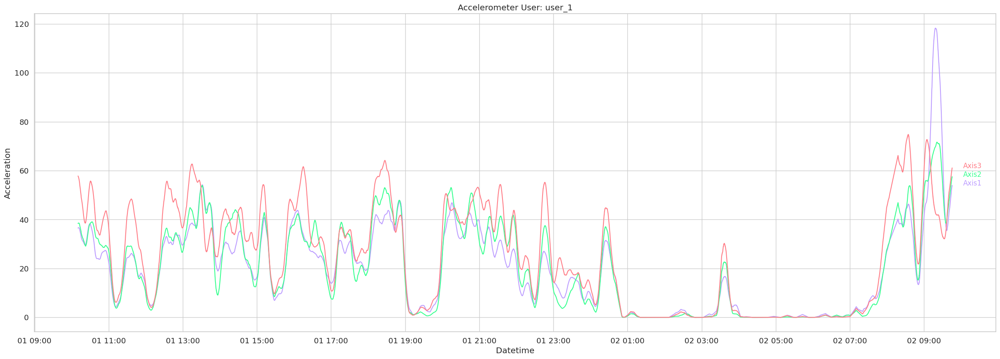

In [66]:
# Se calcula la media móvil de las columnas 'Axis1', 'Axis2' y 'Axis3' para el user_1
# con una ventana de 600 (tenemos un registro cada segundo) de manera que será una ventana de 10 minutos.
ws = pd.Timedelta(minutes=10)

df_user_1_mm = media_movil_acelerometro(df_user_1, ws, 2) # Se calcula la media móvil 2 veces

fig, ax = plt.subplots(figsize=(30, 10))
plot_accelerometer_user(df_user_1_mm, ax)
plt.show()

Se advierte que, cuando hay un movimiento en uno de los ejes, los otros dos ejes también se ven afectados. Por lo tanto, se puede considerar que los tres ejes están correlacionados. Para mostrar un gráfico más interpretable, se van a mostrar los datos originales una vez calculada la media móvil con una opacidad, y sobre estos se mostrará una nueva serie que será la media de los tres ejes (tras calcular la media móvil).

In [67]:
df_user_1_mm['Axis_comb'] = sum([df_user_1_mm['Axis1'], df_user_1_mm['Axis2'], df_user_1_mm['Axis3']]) / 3

In [68]:
def plot_accelerometer_user_opacity(df_user, ax, aplha_org=0.5):
    """
    Función para plotear los datos de un usuario en un eje
    
    Args:
        df_user (pd.DataFrame): DataFrame con los datos de un usuario
        ax (matplotlib.axes): Eje en el que se van a plotear los datos

    Returns:
        None
    """ 

    acc_1 = df_user['Axis1']
    acc_2 = df_user['Axis2']
    acc_3 = df_user['Axis3']

    lw = 0.7
    ax.plot(df_user['datetime'], acc_1, label='Axis1', color="#BD9EFF", alpha=aplha_org, linewidth=lw)
    ax.plot(df_user['datetime'], acc_2, label='Axis2', color="#38FF90", alpha=aplha_org, linewidth=lw)
    ax.plot(df_user['datetime'], acc_3, label='Axis3', color="#FF7D87", alpha=aplha_org, linewidth=lw)
    ax.plot(df_user['datetime'], df_user['Axis_comb'], label='Media 3 ejes', color="#000078", alpha=1, linewidth=2)

    ax.set_title(f"Acelerómetro con media movil. Usuario: {df_user['User'].iloc[0]}")
    ax.set_xlabel('Fecha y hora')
    ax.set_ylabel('Aceleración (N/m)')

    # Se añade una leyenda  horizontal en la parte superior que indica a que corresponde caada color
    color_labels = {'Axis1': '#BD9EFF', 'Axis2': '#38FF90', 'Axis3': '#FF7D87', 'Media 3 ejes': '#000078'}
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=4, labels=color_labels)

    # Configura el eje x para mostar el número del día y la HH:MM en base a lo que hay en 'datetime'
    ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%d %H:%M'))
    ax.xaxis.set_major_locator(plt.matplotlib.dates.HourLocator(interval=2))
    plt.xticks(rotation=0)

    ax.set_xlim([df_user['datetime'].iloc[0], df_user['datetime'].iloc[-1] + pd.Timedelta(hours=2.5)])

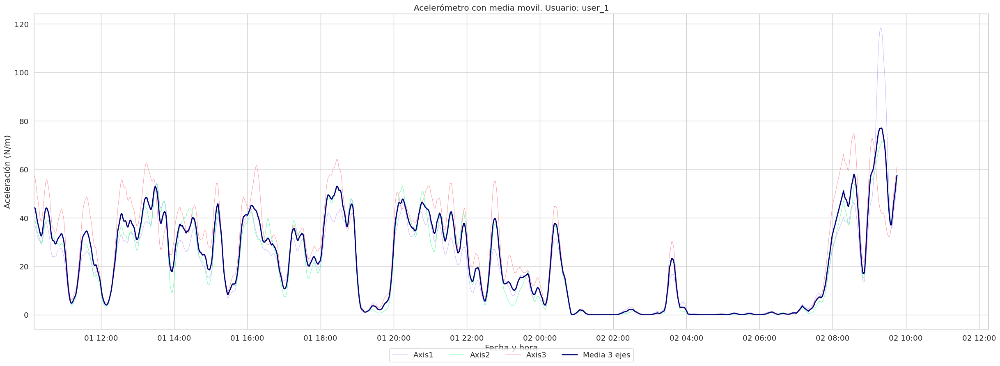

In [69]:
fig, ax = plt.subplots(figsize=(30, 10))
plot_accelerometer_user_opacity(df_user_1_mm, ax, aplha_org=0.8)

Hay otra variable denominada Vector Magnitude que representa en una única variable cuál es el valor de aceleración compuesto de los 3 ejes. Esta medida también puede ser representativa de la cantidad de movimiento al igual que lo era Axis_comb. Se va a calcular la media móvil de la variable Vector Magnitude y se compararán ambos valores para determinar cuál es más representativo de la cantidad de movimiento.


Se calculan las medias móviles para cada usuario en el dataset original y se sobrescriben las columnas *Axis1*, *Axis2* y *Axis3* con las medias móviles calculadas. Seguidamente, se calcula la media de los 3 ejes y se plotean las variables *Axis_comb* y *Vector Magnitude*. Con esto se podrá ver cuál es más representativa de las mismas.

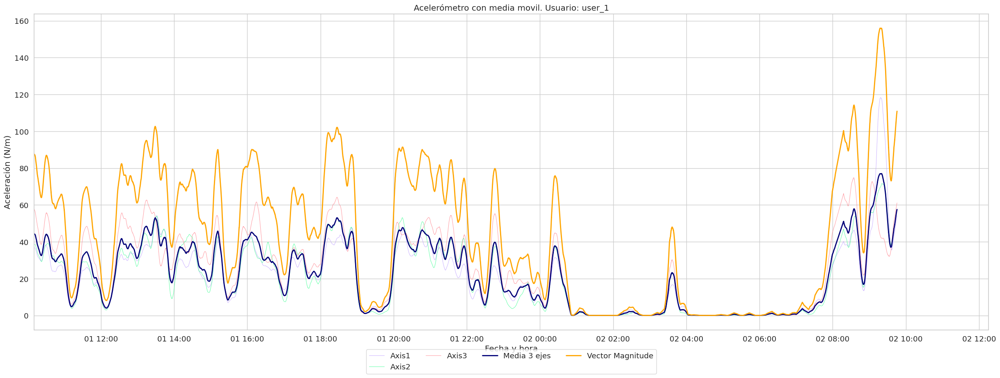

In [70]:
# Se plotea el acelerómetro con los 3 ejes y el vector magnitud (cuya media movil ya se ha calculado)
fig, ax = plt.subplots(figsize=(30, 10))

acc_1 = df_user_1_mm['Axis1']
acc_2 = df_user_1_mm['Axis2']
acc_3 = df_user_1_mm['Axis3']    

lw = 0.7
aplha_org = 0.8
ax.plot(df_user_1_mm['datetime'], acc_1, label='Axis1', color="#BD9EFF", alpha=aplha_org, linewidth=lw)
ax.plot(df_user_1_mm['datetime'], acc_2, label='Axis2', color="#38FF90", alpha=aplha_org, linewidth=lw)
ax.plot(df_user_1_mm['datetime'], acc_3, label='Axis3', color="#FF7D87", alpha=aplha_org, linewidth=lw)
ax.plot(df_user_1_mm['datetime'], df_user_1_mm['Axis_comb'], label='Media 3 ejes', color="#000078", alpha=1, linewidth=2)
ax.plot(df_user_1_mm['datetime'], df_user_1_mm['Vector Magnitude'], label='Media 3 ejes', color="orange", alpha=1, linewidth=2)

ax.set_title(f"Acelerómetro con media movil. Usuario: {df_user_1_mm['User'].iloc[0]}")
ax.set_xlabel('Fecha y hora')
ax.set_ylabel('Aceleración (N/m)')

# Se añade una leyenda  horizontal en la parte superior que indica a que corresponde caada color
color_labels = {'Axis1': '#BD9EFF', 'Axis2': '#38FF90', 'Axis3': '#FF7D87', 'Media 3 ejes': '#000078', 'Vector Magnitude': 'orange'}
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=4, labels=color_labels)

# Configura el eje x para mostar el número del día y la HH:MM en base a lo que hay en 'datetime'
ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%d %H:%M'))
ax.xaxis.set_major_locator(plt.matplotlib.dates.HourLocator(interval=2))
plt.xticks(rotation=0)

ax.set_xlim([df_user_1_mm['datetime'].iloc[0], df_user_1_mm['datetime'].iloc[-1] + pd.Timedelta(hours=2.5)])

plt.show()

Se observa que tanto la media de los 3 ejes como la variable Vector Magnitud reflejan perfectamente el comportamiento de los movimientos individuales. La media de los 3 ejes presenta valores más próximos a la magnitud de los ejes 2 y 3, mientras que el vector magnitud presenta valores más altos, debido a que se debe al cálculo de las componentes del vector y no a una media aritmética. Por ello, se decide usar la variable Vector Magnitud para el análisis de los datos ya que es una variable directamente dada, a la cual ha de aplicarse la media móvil para cada usuario.

In [71]:
# Se obtienen los head de los usuarios user_1, user_2 y user_3 antes de aplicar la media móvil
user_1_head_before = df_actigraph[df_actigraph['User'] == 'user_1'][['datetime', 'Axis1', 'Axis2', 'Axis3', 'Vector Magnitude']].head()
user_2_head_before = df_actigraph[df_actigraph['User'] == 'user_2'][['datetime', 'Axis1', 'Axis2', 'Axis3', 'Vector Magnitude']].head()
user_3_head_before = df_actigraph[df_actigraph['User'] == 'user_3'][['datetime', 'Axis1', 'Axis2', 'Axis3', 'Vector Magnitude']].head()

# Se calculan las medias móviles agrupando por usuario N veces
N = 3  # Número de veces que se calculará la media móvil
df_actigraph = df_actigraph.groupby('User').apply(lambda x: media_movil_acelerometro(x, ws, N))

# Se obtienen los head de los usuarios user_1, user_2 y user_3 después de aplicar la media móvil
user_1_head_after = df_actigraph[df_actigraph['User'] == 'user_1'][['datetime', 'Axis1', 'Axis2', 'Axis3', 'Vector Magnitude']].head()
user_2_head_after = df_actigraph[df_actigraph['User'] == 'user_2'][['datetime', 'Axis1', 'Axis2', 'Axis3', 'Vector Magnitude']].head()
user_3_head_after = df_actigraph[df_actigraph['User'] == 'user_3'][['datetime', 'Axis1', 'Axis2', 'Axis3', 'Vector Magnitude']].head()

/tmp/ipykernel_11176/455867791.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_actigraph = df_actigraph.groupby('User').apply(lambda x: media_movil_acelerometro(x, ws, N))
/tmp/ipykernel_11176/455867791.py:8: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_actigraph = df_actigraph.groupby('User').apply(lambda x: media_movil_acelerometro(x, ws, N))


In [72]:
# Se muestran los head antes y después de aplicar la media móvil (usa html y muestra a la izquierda antes y a la derecha después)
# Ponlo con un formato bonito con su titulo y sus nombres de usuario

html_content = """
<h2>Comparación antes y después de aplicar la media móvil</h2>
<div style="display: flex; justify-content: space-between;">
    <div style="width: 45%;">
        <h3>Antes de aplicar la media móvil</h3>
        <h4>User 1</h4>
        {user_1_head_before}
        <h4>User 2</h4>
        {user_2_head_before}
        <h4>User 3</h4>
        {user_3_head_before}
    </div>
    <div style="width: 45%;">
        <h3>Después de aplicar la media móvil</h3>
        <h4>User 1</h4>
        {user_1_head_after}
        <h4>User 2</h4>
        {user_2_head_after}
        <h4>User 3</h4>
        {user_3_head_after}
    </div>
</div>
"""

display(HTML(html_content.format(
    user_1_head_before=user_1_head_before.to_html(classes='table table-striped'),
    user_2_head_before=user_2_head_before.to_html(classes='table table-striped'),
    user_3_head_before=user_3_head_before.to_html(classes='table table-striped'),
    user_1_head_after=user_1_head_after.to_html(classes='table table-striped'),
    user_2_head_after=user_2_head_after.to_html(classes='table table-striped'),
    user_3_head_after=user_3_head_after.to_html(classes='table table-striped')
)))

,datetime,Axis1,Axis2,Axis3,Vector Magnitude
0,1900-01-01 10:10:22,0,0,0,0.000
1,1900-01-01 10:10:23,11,4,7,13.640
2,1900-01-01 10:10:24,0,21,10,23.260
3,1900-01-01 10:10:25,0,1,24,24.020
4,1900-01-01 10:10:26,34,14,63,72.950
,datetime,Axis1,Axis2,Axis3,Vector Magnitude
268269,1900-01-01 10:03:21,19,120,72,141.230
268270,1900-01-01 10:03:22,89,188,113,236.720
268271,1900-01-01 10:03:23,107,30,94,145.550
268272,1900-01-01 10:03:24,127,65,120,186.420


Se observa que los valores de las columnas 'Axis1', 'Axis2', 'Axis3' y 'Vector Magnitude' han cambiado tras aplicar la media móvil. Siendo estos valores mucho más suaves y permitiendo realizar una mejor visualización de los datos como ha sido mostrado en la gráfica anterior.

Se visualizan todos los registros del acelerómetro de todos los usuarios (ya se ha calculado la media movil). Modificamos la función para plotear el *Vector Magnitude* en lugar de *Axis_comb*.

In [73]:
def plot_accelerometer_user_opacity(df_user, ax, aplha_org=0.5):
    """
    Función para plotear los datos de un usuario en un eje
    
    Args:
        df_user (pd.DataFrame): DataFrame con los datos de un usuario
        ax (matplotlib.axes): Eje en el que se van a plotear los datos

    Returns:
        None
    """ 

    acc_1 = df_user['Axis1']
    acc_2 = df_user['Axis2']
    acc_3 = df_user['Axis3']

    lw = 0.7
    ax.plot(df_user['datetime'], acc_1, label='Axis1', color="#BD9EFF", alpha=aplha_org, linewidth=lw)
    ax.plot(df_user['datetime'], acc_2, label='Axis2', color="#38FF90", alpha=aplha_org, linewidth=lw)
    ax.plot(df_user['datetime'], acc_3, label='Axis3', color="#FF7D87", alpha=aplha_org, linewidth=lw)
    ax.plot(df_user['datetime'], df_user['Vector Magnitude'], label='Magnitud del vector', color="orange", alpha=1, linewidth=2)

    ax.set_title(f"Acelerómetro con media movil. Usuario: {df_user['User'].iloc[0]}")
    ax.set_xlabel('Fecha y hora')
    ax.set_ylabel('Aceleración (N/m)')

    # Se añade una leyenda  horizontal en la parte superior que indica a que corresponde caada color
    color_labels = {'Axis1': '#BD9EFF', 'Axis2': '#38FF90', 'Axis3': '#FF7D87', 'Vector Magnitude': 'orange'}
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=4, labels=color_labels)

    # Configura el eje x para mostar el número del día y la HH:MM en base a lo que hay en 'datetime'
    ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%d %H:%M'))
    ax.xaxis.set_major_locator(plt.matplotlib.dates.HourLocator(interval=2))
    plt.xticks(rotation=0)


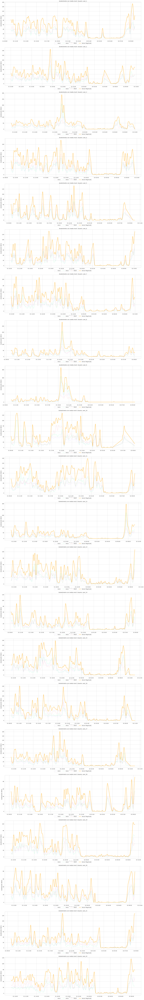

In [74]:
users_list = df_actigraph['User'].unique().tolist()
users_list.sort(key=lambda x: int(x.split('_')[1]))


# Se crea un plot con 1 columna y tantas filas como usuarios haya
fig, axes = plt.subplots(nrows=len(users_list), ncols=1, figsize=(30, 10 * len(users_list)))

# Se itera sobre los usuarios y se plotea la información
for idx, user in enumerate(users_list):
    df_user = df_actigraph[df_actigraph['User'] == user]
    plot_accelerometer_user_opacity(df_user, axes[idx], aplha_org=0.8)

Se observa que los usuarios tienen un periodo más o menos constante de movimiento durante el día, con oscilaciones que pueden estar relacionadas con diferentes actividades (estar sentado o en movimiento ligero presentarán diferentes valores, siendo más bajo para el primero y más alto para el segundo). También se detecta un periodo con muy poco movimiento por parte del acelerómetro, común a todos los usuarios, que corresponde a la noche del día 1 al día 2. Este decaimiento se relaciona con el sueño. Aunque en general se presentan aceleraciones bastante planas y cercanas a 0, se encuentran pequeños picos que pueden relacionarse con despertares o movimientos en la cama. Será interesante estudiar si el movimiento se relaciona con la eficiencia del sueño cuando se comparen estos dos conjuntos de datos, o si los usuarios que presentan más aceleraciones a lo largo del día (se mueven más) también lo hacen por la noche. Además, se podría investigar la relación entre el consumo de alcohol y tabaco con la cantidad de movimiento.

Destaca un pico muy alto en la noche del día 1 al 2 de los usuarios 1, 2 y 18.

**Steps**

La variable *Step* recoge el número de pasos que se da en un segundo. A continuación se analizará la distribución de esta variable y se calculará el número de pasos para cada usuario en función del tiempo.

In [75]:
# Calculamos los descriptivos estadísticos básicos
print("Estadísticos básicos de los datos de pasos por segundo:")
print(df_actigraph['Steps'].describe())
print("\n")

print("Recuento de los valores únicos de los datos de pasos por segundo:") 
print(df_actigraph['Steps'].value_counts())

Estadísticos básicos de los datos de pasos por segundo:
count   1462678.000
mean          0.184
std           0.439
min           0.000
25%           0.000
50%           0.000
75%           0.000
max           4.000
Name: Steps, dtype: float64


Recuento de los valores únicos de los datos de pasos por segundo:
Steps
0    1222011
1     214337
2      24020
3       2228
4         82
Name: count, dtype: int64


En base a los resultados obtenidos, se puede observar que la mayoría de los registros tienen 0 pasos, seguido de 1 paso. El número de pasos máximo es de 4. Esta variable toma los valores 0, 1, 2, 3 y 4. Valores que tienen sentido ya que se corresponden con el número de pasos que puede dar una persona en un segundo.

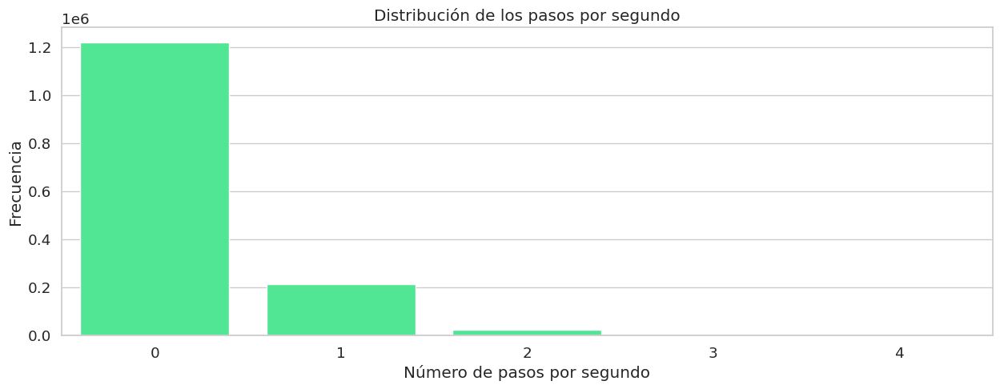

In [76]:
# Se muestra la distribución de los pasos con un gráfico de barras
sns.set_style("whitegrid")

df_fq_steps = df_actigraph['Steps'].value_counts().reset_index()

fig, ax = plt.subplots(figsize=(15, 5))
sns.barplot(data=df_fq_steps, x='Steps', y='count', ax=ax, color='#38FF90')
ax.set_xlabel('Número de pasos por segundo')
ax.set_ylabel('Frecuencia')
ax.set_title('Distribución de los pasos por segundo')

plt.show()

Se ve que 1 200 000 registros contienen 0 pasos por segundo. Lo que indica que en ese instante de tiempo no se ha detectado ningún paso. Se tiene del orden de 200 000 registros con 1 paso por segundo y unos 25 000 registros con 2 pasos por segundo. Para 3 pasos por segundo hay unos 2 000 registros y para 4 pasos por segundo 80 registros. Esto indica que la mayoría de los registros contienen 0 pasos por segundo y que a medida que aumenta el número de pasos por segundo disminuye el número de registros.

Esto ayuda a tener una visión general de cómo se comporta esta variable a lo largo de todo el dataset, pero es poco útil para medir qué ususario se mueve más que el resto. Agruparemos el número de pasos por usuario para ver si hay variabilidad entre estos o presentan un acumulado de pasos similar. Como los usuarios pueden tener diferentes longitudes de medidas, se normalizará el número de pasos acumulado por la duración de las muestras de cada usuario.

In [77]:
# Calculamos el número de pasos agrupando por usuario
df_actigraph.reset_index(drop=True, inplace=True)
df_steps_user = df_actigraph.groupby('User')['Steps'].sum().reset_index()

# Calculamos la cantidad de segundos en los que hay registros para cada usuario
df_steps_user['Amount_rows'] = df_actigraph.groupby('User')['Steps'].count().reset_index()['Steps']

# Calculamos los pasos normalizados para cada usuario
df_steps_user['Normalized_steps'] = df_steps_user['Steps'] / df_steps_user['Amount_rows']

# Se muestra un head del df
df_steps_user.sort_values('Normalized_steps', ascending=False, inplace=True)
df_steps_user.reset_index(drop=True, inplace=True)
display(df_steps_user)

/tmp/ipykernel_11176/2480522540.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_steps_user = df_actigraph.groupby('User')['Steps'].sum().reset_index()
/tmp/ipykernel_11176/2480522540.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_steps_user['Amount_rows'] = df_actigraph.groupby('User')['Steps'].count().reset_index()['Steps']


,User,Steps,Amount_rows,Normalized_steps
0,user_11,19683,68362,0.288
1,user_3,17822,67772,0.263
2,user_8,16166,61678,0.262
3,user_10,14137,58616,0.241
4,user_15,15445,71045,0.217
5,user_2,12415,60862,0.204
6,user_1,13625,67936,0.201
7,user_22,13354,67874,0.197
8,user_12,13473,68739,0.196
9,user_4,11958,64796,0.185


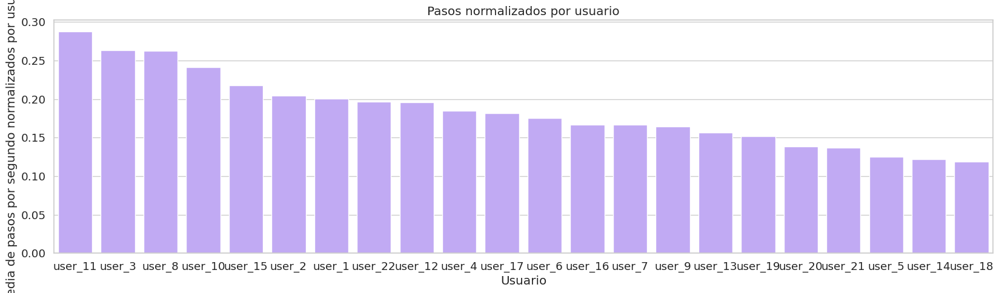

In [78]:
# Se plotea un gráfico de barras con el ranking de los pasos normalizados
sns.set_style("whitegrid")

fig, ax = plt.subplots(figsize=(20, 5))

# Aseguramos que los usuarios se muestren en el mismo orden que están en el DataFrame
sns.barplot(data=df_steps_user, x='User', y='Normalized_steps', ax=ax, color='#BD9EFF', order=df_steps_user['User'])

ax.set_xlabel('Usuario')
ax.set_ylabel('Media de pasos por segundo normalizados por ususario')
ax.set_title('Pasos normalizados por usuario')

plt.show()

Se observa que hay usuarios con una media de pasos por segundo normalizados de 0.29 como valor más alto y de 0.12 como valor más bajo. Aunque hay una variabilidad elevada, de más del doble, se observa una progresión entre los usuarios que dan más pasos y los que dan menos. No se forman clústeres claros entre las personas que dan más o menos pasos.

Se analizará los pasos por usuario agrupados en instantes de tiempo. Así se podrá analizar si hay usuarios que tienen más actividad en ciertos momentos del día o si por el contrario el número de pasos se mantiene constante a lo largo del día.

In [79]:
def plot_user_steps(df_user, ax, group_time=pd.Timedelta(minutes=30)):
    """
    Función para plotear los pasos de un usuario en un eje agrupados por tiempo
    en función de group_time.

    Args:
        df_user (pd.DataFrame): DataFrame con los datos de un usuario
        ax (matplotlib.axes): Eje en el que se van a plotear los datos
        group_time (pd.Timedelta): Tiempo en el que se van a agrupar los datos
    """

    # Se calculan los intervalos de tiempo en función del instante inicial y final de los datos
    min_time = df_user['datetime'].min()
    max_time = df_user['datetime'].max()
    time_range = pd.date_range(min_time, max_time + group_time, freq=group_time)

    # Se agrupan los datos en función de los intervalos de tiempo
    df_user_grouped = df_user.groupby(pd.cut(df_user['datetime'], time_range), observed=False)['Steps'].sum().reset_index()

    # Se calculan las marcas de clase de los intervalos de tiempo
    df_user_grouped['mark_datetime'] = df_user_grouped['datetime'].apply(lambda x: x.mid)

    # Se plotean los datos agrupados en función del tiempo como un gráfico de líneas
    ax.plot(df_user_grouped['mark_datetime'], df_user_grouped['Steps'], color='#38FF90', linewidth=2)

    # Group_time a formato string más legible (HH:MM)
    group_time_str = f"{group_time.components.hours:02} horas y {group_time.components.minutes:02} minutos."

    # Se establecen los títulos y los ejes
    ax.set_title(f'Pasos por usuario: {df_user["User"].iloc[0]}\n agrupados por {group_time_str}')
    ax.set_ylabel('Pasos agrupados')
    ax.set_xlabel('Día y hora')
    
    # Configura el eje x para mostar el número del día y la HH:MM en base a lo que hay en 'datetime'
    ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%d %H:%M'))
    ax.xaxis.set_major_locator(plt.matplotlib.dates.HourLocator(interval=2))
    plt.xticks(rotation=0)

    return ax

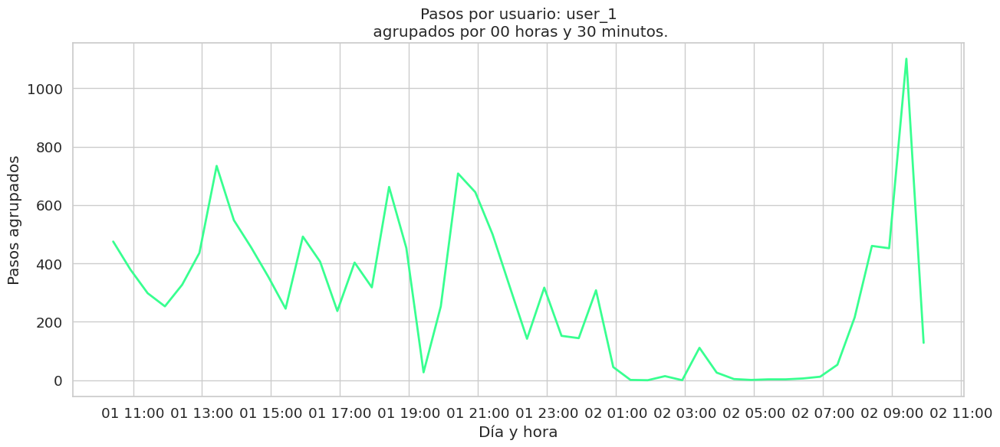

In [80]:
df_user_1 = df_actigraph[df_actigraph['User'] == 'user_1']

fig, ax = plt.subplots(figsize=(15, 6))
plot_user_steps(df_user_1, ax, pd.Timedelta(minutes=30))

plt.show()

Se procede a iterar sobre todos los usuarios y mostrar sus pasos agrupados por intervalos de tiempo de 30 minutos.

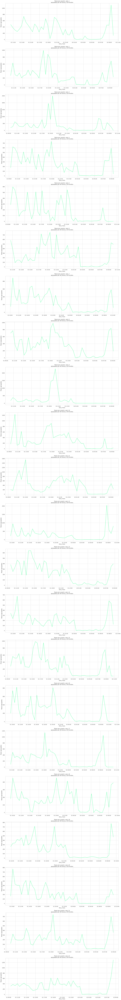

In [81]:
# Se crea un plot con 1 columna y tantas filas como usuarios haya
fig, axes = plt.subplots(nrows=len(users_list), ncols=1, figsize=(25, 10 * len(users_list)))

# Se itera sobre los usuarios y se plotea la información
for idx, user in enumerate(users_list):
    df_user = df_actigraph[df_actigraph['User'] == user]
    plot_user_steps(df_user, axes[idx], pd.Timedelta(minutes=30))

plt.show()

Al igual que pasaba con los datos del acelerómetro, los datos de pasos también presentan un claro patrón con momentos del día con más y menos actividad. Destaca que todos los usuarios no presentan valores en la noche del día 1 al 2, lo que refleja un claro patrón de sueño.

In [82]:
# Agrupamos por usuario y calculamos los pasos en intervalos de 30 minutos
interval = pd.Timedelta(minutes=30)

df_user_steps_interval = df_actigraph[['User', 'datetime', 'Steps']].groupby('User', observed=False).apply(
    lambda df_user: df_user.groupby(pd.cut(df_user['datetime'], 
                                           pd.date_range(df_user['datetime'].min(), 
                                                         df_user['datetime'].max() + interval, 
                                                         freq=interval)), observed=False)['Steps'].sum().reset_index()
).reset_index(level=0)

# Que User vuelva a ser una columna, no un índice
df_user_steps_interval.reset_index(drop=True, inplace=True)

# Renombramos las columnas para mayor claridad
df_user_steps_interval.rename(columns={'datetime': 'Interval'}, inplace=True)

# Separamos la columna 'Interval' en 'start' y 'end'
df_user_steps_interval[['start_interval', 'end_interval']] = df_user_steps_interval['Interval'].apply(lambda x: pd.Series([x.left, x.right]))

# Reordenamos las columnas
df_user_steps_interval = df_user_steps_interval[['User', 'start_interval', 'end_interval', 'Steps']]

# Mostramos el DataFrame resultante
display(df_user_steps_interval)

/tmp/ipykernel_11176/2018430036.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_user_steps_interval = df_actigraph[['User', 'datetime', 'Steps']].groupby('User', observed=False).apply(


,User,start_interval,end_interval,Steps
0,user_1,1900-01-01 10:10:22,1900-01-01 10:40:22,475
1,user_1,1900-01-01 10:40:22,1900-01-01 11:10:22,379
2,user_1,1900-01-01 11:10:22,1900-01-01 11:40:22,298
3,user_1,1900-01-01 11:40:22,1900-01-01 12:10:22,253
4,user_1,1900-01-01 12:10:22,1900-01-01 12:40:22,327
...,...,...,...,...
1065,user_9,1900-01-02 07:06:41,1900-01-02 07:36:41,0
1066,user_9,1900-01-02 07:36:41,1900-01-02 08:06:41,0
1067,user_9,1900-01-02 08:06:41,1900-01-02 08:36:41,0
1068,user_9,1900-01-02 08:36:41,1900-01-02 09:06:41,0


**Inclinometer Off/Standing/Sitting/Lying**

Estas 4 variables reportan el estado en el que se encuentra el usuario en un momento dado según el inclinómetro:

- *Inclinometer Off*: valores iguales a 1 indican que el inclinómetro no está activado. Los valores se reportan por segundo.
- *Inclinometer Standing*: valores iguales a 1 indican que el usuario está de pie, mientras que 0 indica otras posiciones del usuario. Los valores se reportan por segundo.
- *Inclinometer Sitting*: valores iguales a 1 indican que el usuario está sentado, mientras que 0 indica otras posiciones del usuario. Los valores se reportan por segundo.
- *Inclinometer Lying*: valores iguales a 1 indican que el usuario está tumbado, mientras que 0 indica otras posiciones del usuario. Los valores se reportan por segundo.

Parece tratarse de un one-hot encoding de las posiciones del usuario en un momento dado. Se procede a comprobar si en todos los registros se cumple que solo una de las variables es igual a 1 y el resto son 0.

In [83]:
# Seleccionamos las columnas de interés
df_inclinometer = df_actigraph[['User', 'Inclinometer Off', 'Inclinometer Standing', 'Inclinometer Sitting', 'Inclinometer Lying', 'datetime']]

# Se convierte las variables del inclinómetro a entero
pd.options.mode.copy_on_write = True 
df_inclinometer['Inclinometer Off'] = df_inclinometer['Inclinometer Off'].cat.codes
df_inclinometer['Inclinometer Standing'] = df_inclinometer['Inclinometer Standing'].cat.codes
df_inclinometer['Inclinometer Sitting'] = df_inclinometer['Inclinometer Sitting'].cat.codes
df_inclinometer['Inclinometer Lying'] = df_inclinometer['Inclinometer Lying'].cat.codes

# Se comprueban que las 4 columnas solo tengan valores 0 o 1 y mostramos estos valores únicos)
print("Valores únicos de las columnas:")
print(f"  Valores únicos de 'Inclinometer Off': {df_inclinometer['Inclinometer Off'].unique()}")
print(f"  Valores únicos de 'Inclinometer Standing': {df_inclinometer['Inclinometer Standing'].unique()}")
print(f"  Valores únicos de 'Inclinometer Sitting': {df_inclinometer['Inclinometer Sitting'].unique()}")
print(f"  Valores únicos de 'Inclinometer Lying': {df_inclinometer['Inclinometer Lying'].unique()}")

# Se comprueba que se trata de un one-hot encoding en todas las filas y se muestra un mensaje
df_inclinometer['Sum'] = df_inclinometer[['Inclinometer Off', 'Inclinometer Standing', 'Inclinometer Sitting', 'Inclinometer Lying']].sum(axis=1)
if df_inclinometer['Sum'].eq(1).all():
    print("\nSe cumple que en todas las filas solo una de las variables es igual a 1 y el resto son 0.")
else:
    print("\nNo se cumple que en todas las filas solo una de las variables es igual a 1 y el resto son 0.")

Valores únicos de las columnas:
  Valores únicos de 'Inclinometer Off': [0 1]
  Valores únicos de 'Inclinometer Standing': [1 0]
  Valores únicos de 'Inclinometer Sitting': [0 1]
  Valores únicos de 'Inclinometer Lying': [0 1]

Se cumple que en todas las filas solo una de las variables es igual a 1 y el resto son 0.


In [84]:
# Se revisa si hay valores nulos en las columnas
print("\nValores nulos en las columnas:")
print(df_inclinometer.isnull().sum())


Valores nulos en las columnas:
User                     0
Inclinometer Off         0
Inclinometer Standing    0
Inclinometer Sitting     0
Inclinometer Lying       0
datetime                 0
Sum                      0
dtype: int64


Se comprueba si, agrupando por ususario, la variable datetime se salta algún segundo o si es consecutiva. Para ello se calcula el número de segundos entre el primer y el último registro de cada usuario y se compara con el número de registros que tiene cada usuario.

In [85]:
# Se agrupa por usuario y se calcula el número de segundos entre el primer y el último registro
users = df_inclinometer['User'].unique()

for user in users:
    df_user = df_inclinometer[df_inclinometer['User'] == user]
    min_time = df_user['datetime'].min()
    max_time = df_user['datetime'].max()
    seconds = (max_time - min_time).total_seconds() + 1
    n_rows = df_user.shape[0]
    print(f"Usuario: {user}, segundos: {seconds}, registros: {n_rows}")
    
    if seconds / n_rows == 1:
        print("  Se ha registrado un registro por segundo.")
    else:
        print("  No se ha registrado un registro por segundo.")

Usuario: user_1, segundos: 84914.0, registros: 67936
  No se ha registrado un registro por segundo.
Usuario: user_10, segundos: 87339.0, registros: 58616
  No se ha registrado un registro por segundo.
Usuario: user_11, segundos: 87051.0, registros: 68362
  No se ha registrado un registro por segundo.
Usuario: user_12, segundos: 85859.0, registros: 68739
  No se ha registrado un registro por segundo.
Usuario: user_13, segundos: 84205.0, registros: 67350
  No se ha registrado un registro por segundo.
Usuario: user_14, segundos: 85203.0, registros: 67995
  No se ha registrado un registro por segundo.
Usuario: user_15, segundos: 91772.0, registros: 71045
  No se ha registrado un registro por segundo.
Usuario: user_16, segundos: 92182.0, registros: 69850
  No se ha registrado un registro por segundo.
Usuario: user_17, segundos: 91818.0, registros: 68351
  No se ha registrado un registro por segundo.
Usuario: user_18, segundos: 86289.0, registros: 65911
  No se ha registrado un registro por 

En la mayoría de usuarios hay segundos que no se han registrado. Es decir hay huecos en los que no hay registros. Estos se imputarán como valores con el inclinómetro en Off. Y posteriormente podrán ser tratados con técnicas de interpolación.

In [86]:
#En la mayoría de usuarios hay segundos que no se han registrado. Es decir hay huecos en los que no hay registros. Estos se imputarán como valores con el inclinómetro en Off. Y posteriormente podrán ser tratados con técnicas de interpolación.

# Obtenemos los usuarios
users = df_inclinometer['User'].unique()

# Se crea un df vacío
df_inclinometer_filled = pd.DataFrame()

# Se itera sobre los usuarios
for user in users:
    df_user = df_inclinometer[df_inclinometer['User'] == user]
    user = df_user['User'].iloc[0]
    df_user.drop(columns=['Sum', 'User'], inplace=True)
    min_time = df_user['datetime'].min()
    max_time = df_user['datetime'].max()
    time_range = pd.date_range(min_time, max_time, freq='s')

    # Se rellenan los huecos con 0 en las columnas del inclinómetro
    df_user_filled = df_user.set_index('datetime').reindex(time_range, fill_value=0)

    # Si la suma de todas las columna es 0, se rellenan con 1 en la columna 'Inclinometer Off'
    df_user_filled['Sum'] = df_user_filled[['Inclinometer Off', 'Inclinometer Standing', 'Inclinometer Sitting', 'Inclinometer Lying']].sum(axis=1)
    df_user_filled.loc[df_user_filled['Sum'] == 0, 'Inclinometer Off'] = 1
    df_user_filled.drop(columns='Sum', inplace=True)
    
    # Se vuelve a añadir la columna 'User'
    df_user_filled['User'] = user

    # Se quita datetime del índice y se pone como columna
    df_user_filled.reset_index(inplace=True)
    df_user_filled.rename(columns={'index': 'datetime'}, inplace=True)

    # Se añade el df del usuario al df principal
    df_inclinometer_filled = pd.concat([df_inclinometer_filled, df_user_filled])

# Se resetea el índice
df_inclinometer_filled.reset_index(inplace=True, drop=True)

In [87]:
# Se comprubea que hay tantos registros como segundos entre el primer y el último registro de cada usuario
users = df_inclinometer_filled['User'].unique()

for user in users:
    df_user = df_inclinometer_filled[df_inclinometer_filled['User'] == user]
    min_time = df_user['datetime'].min()
    max_time = df_user['datetime'].max()
    seconds = (max_time - min_time).total_seconds() + 1
    n_rows = df_user.shape[0]
    
    if seconds / n_rows == 1:
        print(f"Usuario: {user}")
        print("  Se ha registrado un registro por segundo. No hay huecos.")
    else:
        print("  No se ha registrado un registro por segundo.")
        print(f"Usuario: {user}, segundos: {seconds}, registros: {n_rows}")


Usuario: user_1
  Se ha registrado un registro por segundo. No hay huecos.
Usuario: user_10
  Se ha registrado un registro por segundo. No hay huecos.
Usuario: user_11
  Se ha registrado un registro por segundo. No hay huecos.
Usuario: user_12
  Se ha registrado un registro por segundo. No hay huecos.
Usuario: user_13
  Se ha registrado un registro por segundo. No hay huecos.
Usuario: user_14
  Se ha registrado un registro por segundo. No hay huecos.
Usuario: user_15
  Se ha registrado un registro por segundo. No hay huecos.
Usuario: user_16
  Se ha registrado un registro por segundo. No hay huecos.
Usuario: user_17
  Se ha registrado un registro por segundo. No hay huecos.
Usuario: user_18
  Se ha registrado un registro por segundo. No hay huecos.
Usuario: user_19
  Se ha registrado un registro por segundo. No hay huecos.
Usuario: user_2
  Se ha registrado un registro por segundo. No hay huecos.
Usuario: user_20
  Se ha registrado un registro por segundo. No hay huecos.
Usuario: user_

Como se trata de un one-hot encoding, el inclinómetro solamente puede para cada registro indicar una de los 4 posibles valores.

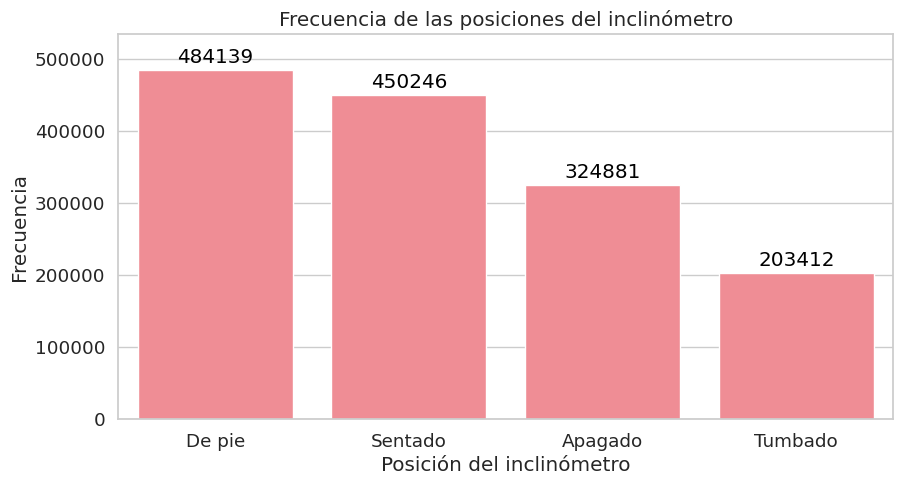

In [88]:
# Se plotea la frecuencia de los valores de las columnas del inclinómetro.
df_inclinometer_freq = df_inclinometer[['Inclinometer Off', 'Inclinometer Standing', 'Inclinometer Sitting', 'Inclinometer Lying']].sum().reset_index()

# Cambiamos el nombre de las columnas a posicion y count
df_inclinometer_freq.columns = ['posicion', 'count']

# Cambiamos los nombres de las diferentes posiciones del inclinómetro
mapper = {
    'Inclinometer Off': 'Apagado',
    'Inclinometer Standing': 'De pie',
    'Inclinometer Sitting': 'Sentado',
    'Inclinometer Lying': 'Tumbado'
}

df_inclinometer_freq['posicion'] = df_inclinometer_freq['posicion'].map(mapper)

# Ordenamos de mayor a menor
df_inclinometer_freq.sort_values(by='count', ascending=False, inplace=True)
df_inclinometer_freq.reset_index(drop=True, inplace=True)

# Se crea el gráfico de barras
sns.set_style("whitegrid")

fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(data=df_inclinometer_freq, x='posicion', y='count', ax=ax, color='#FF7D87')

# Añadir texto encima de cada barra
for index, row in df_inclinometer_freq.iterrows():
    ax.text(index, row['count']+10000, f'{row["count"]}', color='black', ha="center")

ax.set_xlabel('Posición del inclinómetro')
ax.set_ylabel('Frecuencia')
ax.set_title('Frecuencia de las posiciones del inclinómetro')

max_x = df_inclinometer_freq['count'].max()
plt.ylim(0, max_x + 50000)

plt.show()

La mayoría de los registros (es decir, de los segundos) se han registrado en la posición de De pie y Sentado. La posición de Tumbado es la que menos registros tiene. La posición de Apagado es la tercera en número de registros y puede ser que se deba a errores en las medidas o a que el dispositivo no se ha llevado puesto. Para analizar si se trata de un error en la recogida de datos o bien si el usuario no llevaba el dispositivo, se procede a visualizar en forma de heatmap una fila por usuario resaltando el momento en el que el usuario está en la posición de Apagado. Así se podrá analizar si hay periodos largos en los que el usuario no lleva el dispositivo o si se trata de errores en la recogida de datos y se puede imputar con valores cercanos.

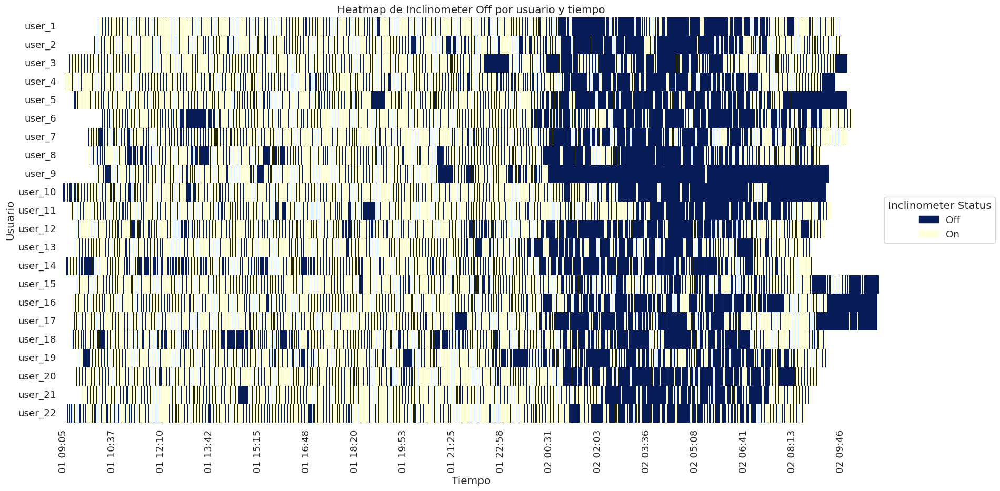

In [89]:
# Configuración de estilo para seaborn
sns.set_style("white")
sns.set_context("notebook", font_scale=1.2)

# Crear la figura y el eje
fig, ax = plt.subplots(figsize=(20, 10))

# Copiar el dataframe con las columnas necesarias
df_heatmap = df_inclinometer_filled[['User', 'Inclinometer Off', 'datetime']].copy()

# Pivotar el dataframe para crear una matriz con usuarios como filas y tiempo como columnas
df_heatmap_pivot = df_heatmap.pivot(index='User', columns='datetime', values='Inclinometer Off')

# Ordenar por el número de usuario detrás de _
df_heatmap_pivot.sort_index(key=lambda x: x.str.split('_').str[1].astype(int), inplace=True)

# Formatear el índice de tiempo para mostrar solo el día y la hora (HH:MM)
df_heatmap_pivot.columns = df_heatmap_pivot.columns.strftime('%d %H:%M')

# Crear el heatmap
sns.heatmap(df_heatmap_pivot, cmap='YlGnBu', cbar=False, ax=ax)
ax.set_title('Heatmap de Inclinometer Off por usuario y tiempo')
ax.set_xlabel('Tiempo')
ax.set_ylabel('Usuario')

# Establece saltos en las etiquetas del eje X para no mostrar tantas en el gráfico
n = 5
for i, label in enumerate(ax.get_xticklabels()):
    if i % n != 0:
        label.set_visible(False)

# Se crea una leyenda fuera del gráfico
colors = {'Off': '#081d58', 'On': '#ffffd9'}
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5), title='Inclinometer Status')

plt.show()

Se observan 2 tipos de comportamiento por un lado hay registros en los que hay un pequeño periodo de tiempo en el que el inclinómetro está apagado y por otro lado hay registros en los que el inclinómetro está apagado durante un periodo de tiempo más largo. El segundo caso es el más frecuente durante las nocher del día 1 al 2. Los periodos pequeños se imputarán en base a la posición que esté registrando el inclinómetro en sus proximidades. Mientras que en los periodos largos se mantendrá como apagado.

A continuación, se calculará la duración en segundos de los intervalos con el inclinómetro apagado de cada usuario. Con esto se consiguen identificar aquellos intervalos pequeños que se deban a apagados puntuales y que se puedan imputar.

In [90]:
# Se calcula la duración de los intervalos dde tiempo apagados por ususario
df_inclinometer_filled[['User', 'Inclinometer Off', 'datetime']]

# Filtramos solo las filas donde el inclinómetro está apagado
df_incl_off = df_inclinometer_filled[df_inclinometer_filled['Inclinometer Off'] == 1].copy()

# Creamos una columna para identificar los intervalos consecutivos
df_incl_off['interval_group'] = (df_incl_off['datetime'].diff() != pd.Timedelta(seconds=1)).cumsum()

# Agrupamos por usuario y por grupo de intervalos consecutivos
invervals_off = df_incl_off.groupby(['User', 'interval_group']).agg(
    start_time=('datetime', 'min'),
    end_time=('datetime', 'max'),
    duration=('datetime', lambda x: (x.max() - x.min()).total_seconds() + 1)  # Duración en segundos
).reset_index()

# Eliminamos la columna 'interval_group' si no es necesaria
invervals_off = invervals_off.drop(columns=['interval_group'])

# Mostramos los resultados del user 1
print(invervals_off[invervals_off['User'] == 'user_1'])

# Mostramos los descriptivos estadísticos de la duración de los intervalos apagados
intervals_off_stats = invervals_off['duration'].describe().to_frame().T
display(intervals_off_stats)

# Se muestran los percentiles 0.01, 0.05, 0.1, 0.2, 0.3, ..., 0.9, 0.95, 0.99
percentiles = [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 0.99, 1]
intervals_off_percentiles = invervals_off['duration'].quantile(percentiles).to_frame().T
intervals_off_percentiles.columns = [f'{int(p*100)}%' for p in percentiles]
display(intervals_off_percentiles)

        User          start_time            end_time  duration
0     user_1 1900-01-01 10:10:33 1900-01-01 10:11:00    28.000
1     user_1 1900-01-01 10:11:06 1900-01-01 10:11:50    45.000
2     user_1 1900-01-01 10:12:12 1900-01-01 10:12:14     3.000
3     user_1 1900-01-01 10:12:18 1900-01-01 10:12:23     6.000
4     user_1 1900-01-01 10:12:40 1900-01-01 10:12:40     1.000
...      ...                 ...                 ...       ...
2120  user_1 1900-01-02 09:43:17 1900-01-02 09:43:23     7.000
2121  user_1 1900-01-02 09:43:50 1900-01-02 09:43:55     6.000
2122  user_1 1900-01-02 09:44:23 1900-01-02 09:44:28     6.000
2123  user_1 1900-01-02 09:44:56 1900-01-02 09:45:01     6.000
2124  user_1 1900-01-02 09:45:29 1900-01-02 09:45:34     6.000

[2125 rows x 4 columns]


,count,mean,std,min,25%,50%,75%,max
duration,50035.000,15.347,149.327,1.000,6.000,6.000,6.000,17905.000


,1%,5%,10%,20%,30%,40%,50%,60%,70%,80%,90%,95%,99%,100%
duration,1.000,2.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,8.000,16.000,160.000,17905.000


Se observa que hasta el percentil 90 la duración de los intervalos apagados es de 6 segundos. A partir del percentil 95 la duración aumenta considerablemente, llegando a 160 segundos en el percentil 99 y 17905 segundos en el percentil 100. Esto indica que la mayoría de los intervalos apagados duran 6 segundos, pero hay algunos intervalos que duran mucho más. Por lo que solamente se imputarán aquellos intervalos con una duración de 6 segundos o menos.

Se comienza por crear una columna con la máscara de los gaps que se van a imputar (con una duración inferior o igual a 6 segundos)

In [91]:
# Se crea una columna que indica si la duración del intervalo es menor o igual a 6 seg en ese caso pon un 1
invervals_off['flag_impute']= invervals_off['duration'].apply(lambda x: 1 if x <= 6 else 0)
invervals_off

,User,start_time,end_time,duration,flag_impute
0,user_1,1900-01-01 10:10:33,1900-01-01 10:11:00,28.000,0
1,user_1,1900-01-01 10:11:06,1900-01-01 10:11:50,45.000,0
2,user_1,1900-01-01 10:12:12,1900-01-01 10:12:14,3.000,1
3,user_1,1900-01-01 10:12:18,1900-01-01 10:12:23,6.000,1
4,user_1,1900-01-01 10:12:40,1900-01-01 10:12:40,1.000,1
...,...,...,...,...,...
50030,user_9,1900-01-02 05:30:29,1900-01-02 05:30:30,2.000,1
50031,user_9,1900-01-02 05:30:36,1900-01-02 05:30:58,23.000,0
50032,user_9,1900-01-02 05:31:13,1900-01-02 05:31:18,6.000,1
50033,user_9,1900-01-02 05:31:46,1900-01-02 05:31:51,6.000,1


Seguidamente, se realiza la imputación de datos faltantes de los gap del inclinómetro con intervalo inferior o igual a 6 segundos. Si la variable flag_load es True, se intenta cargar un DataFrame previamente imputado desde un archivo. Si no existe, se solicita cambiar flag_load a False. Si flag_load es False, se ordenan los datos por usuario y tiempo, y se crea una copia del DataFrame para realizar las imputaciones. Se precalculan las posiciones donde la columna 'Inclinometer Off' es 0 para cada usuario. Luego, se define una función para encontrar el valor más cercano que no sea "off" y otra para procesar intervalos de tiempo específicos. Los intervalos marcados para imputación se procesan en paralelo, y las actualizaciones se aplican al DataFrame copiado. Finalmente, el DataFrame imputado se guarda en un archivo y se imprime el resultado.

In [92]:
flag_load = True # Si es false calcula la imputación, si es true carga el DataFrame con la imputación ya realizada si existe

if flag_load:
    # Se comprueba si existe
    if os.path.exists('../0_data/clean_MMASH/inclinometer_imputed.pkl'):
        df_inclinometer_imputed = pd.read_pickle('../0_data/clean_MMASH/inclinometer_imputed.pkl')
        print(df_inclinometer_imputed)
    else:
        print("No se ha encontrado el archivo con la imputación.\n Por favor, cambie el valor de la variable 'flag_load' a False.")
else:
    
    # Ordenar los datos por usuario y tiempo
    df_inclinometer_filled.sort_values(by=['User', 'datetime'], inplace=True)

    # Crear una copia del DataFrame para realizar imputaciones
    df_inclinometer_imputed = df_inclinometer_filled.copy()

    # Precalcular las posiciones donde "Inclinometer Off" es 0 por usuario
    precomputed_non_off = {}
    for user, group in df_inclinometer_filled.groupby('User'):
        non_off_indices = group[group['Inclinometer Off'] == 0][['datetime', 'Inclinometer Standing', 'Inclinometer Sitting', 'Inclinometer Lying']]
        precomputed_non_off[user] = non_off_indices

    # Función para encontrar el valor más cercano que no sea "off"
    def find_closest_value_fast(timestamp, user_non_off_data):
        before = user_non_off_data[user_non_off_data['datetime'] <= timestamp].iloc[-1:]  # Más cercano por la izquierda
        after = user_non_off_data[user_non_off_data['datetime'] > timestamp].iloc[:1]   # Más cercano por la derecha

        if not before.empty and not after.empty:
            return before.iloc[0, 1:] if (timestamp - before.iloc[0, 0]) <= (after.iloc[0, 0] - timestamp) else after.iloc[0, 1:]
        elif not before.empty:
            return before.iloc[0, 1:]
        elif not after.empty:
            return after.iloc[0, 1:]
        else:
            return [0, 0, 0]  # Caso extremo: sin valores cercanos

    # Función para procesar un intervalo
    def process_interval(interval):
        user = interval['User']
        start_time = interval['start_time']
        end_time = interval['end_time']

        # Obtener los datos precalculados para el usuario
        user_non_off_data = precomputed_non_off.get(user, pd.DataFrame())
        if user_non_off_data.empty:
            return []  # Si no hay datos no "off" para este usuario, saltar

        # Filtrar los datos del usuario en el intervalo
        user_data = df_inclinometer_filled[(df_inclinometer_filled['User'] == user) & (df_inclinometer_filled['datetime'] >= start_time) & (df_inclinometer_filled['datetime'] <= end_time)]
        off_indices = user_data[user_data['Inclinometer Off'] == 1].index

        updates = []
        for idx in off_indices:
            timestamp = df_inclinometer_filled.loc[idx, 'datetime']
            imputed_values = find_closest_value_fast(timestamp, user_non_off_data).astype(np.int64)

            # Guardar las actualizaciones para aplicar posteriormente
            updates.append((idx, imputed_values))

        return updates

    # Paralelizar el procesamiento de los intervalos
    flagged_intervals = invervals_off[invervals_off['flag_impute'] == 1]
    with Pool(cpu_count()) as pool:
        all_updates = list(tqdm(pool.imap(process_interval, flagged_intervals.to_dict('records')), total=flagged_intervals.shape[0], desc="Procesando intervalos"))

    # Aplicar las actualizaciones
    for updates in all_updates:
        for idx, imputed_values in updates:
            df_inclinometer_imputed.loc[idx, ['Inclinometer Standing', 'Inclinometer Sitting', 'Inclinometer Lying']] = imputed_values
            df_inclinometer_imputed.loc[idx, 'Inclinometer Off'] = 0

    # Guardamos el resultado en un archivo pkl
    df_inclinometer_imputed.to_pickle('../0_data/clean_MMASH/inclinometer_imputed.pkl')

    # Resultado imputado
    print(df_inclinometer_imputed)

                   datetime  Inclinometer Off  Inclinometer Standing  \
0       1900-01-01 10:10:22                 0                      1   
1       1900-01-01 10:10:23                 0                      1   
2       1900-01-01 10:10:24                 0                      0   
3       1900-01-01 10:10:25                 0                      0   
4       1900-01-01 10:10:26                 0                      1   
...                     ...               ...                    ...   
1905660 1900-01-02 09:24:29                 1                      0   
1905661 1900-01-02 09:24:30                 1                      0   
1905662 1900-01-02 09:24:31                 1                      0   
1905663 1900-01-02 09:24:32                 1                      0   
1905664 1900-01-02 09:24:33                 1                      0   

         Inclinometer Sitting  Inclinometer Lying    User  
0                           0                   0  user_1  
1              

Se observan los estadísticos de la duración de los huecos tras imputar aquellos con un valor inferior o igual a 6 segundos.

In [93]:
# Se calcula la duración de los intervalos dde tiempo apagados por ususario
df_inclinometer_imputed[['User', 'Inclinometer Off', 'datetime']]

# Filtramos solo las filas donde el inclinómetro está apagado
df_incl_off = df_inclinometer_imputed[df_inclinometer_imputed['Inclinometer Off'] == 1].copy()

# Creamos una columna para identificar los intervalos consecutivos
df_incl_off['interval_group'] = (df_incl_off['datetime'].diff() != pd.Timedelta(seconds=1)).cumsum()

# Agrupamos por usuario y por grupo de intervalos consecutivos
invervals_off = df_incl_off.groupby(['User', 'interval_group']).agg(
    start_time=('datetime', 'min'),
    end_time=('datetime', 'max'),
    duration=('datetime', lambda x: (x.max() - x.min()).total_seconds() + 1)  # Duración en segundos
).reset_index()

# Eliminamos la columna 'interval_group' si no es necesaria
invervals_off = invervals_off.drop(columns=['interval_group'])

# Mostramos los descriptivos estadísticos de la duración de los intervalos apagados
intervals_off_stats = invervals_off['duration'].describe().to_frame().T
display(intervals_off_stats)

# Se muestran los percentiles 0.01, 0.05, 0.1, 0.2, 0.3, ..., 0.9, 0.95, 0.99
percentiles = [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 0.99, 1]
intervals_off_percentiles = invervals_off['duration'].quantile(percentiles).to_frame().T
intervals_off_percentiles.columns = [f'{int(p*100)}%' for p in percentiles]
display(intervals_off_percentiles)

,count,mean,std,min,25%,50%,75%,max
duration,6603.000,79.661,405.235,7.000,8.000,11.000,21.000,17905.000


,1%,5%,10%,20%,30%,40%,50%,60%,70%,80%,90%,95%,99%,100%
duration,7.000,7.000,7.000,7.000,8.000,9.000,11.000,15.000,17.000,28.000,96.800,344.600,1412.940,17905.000


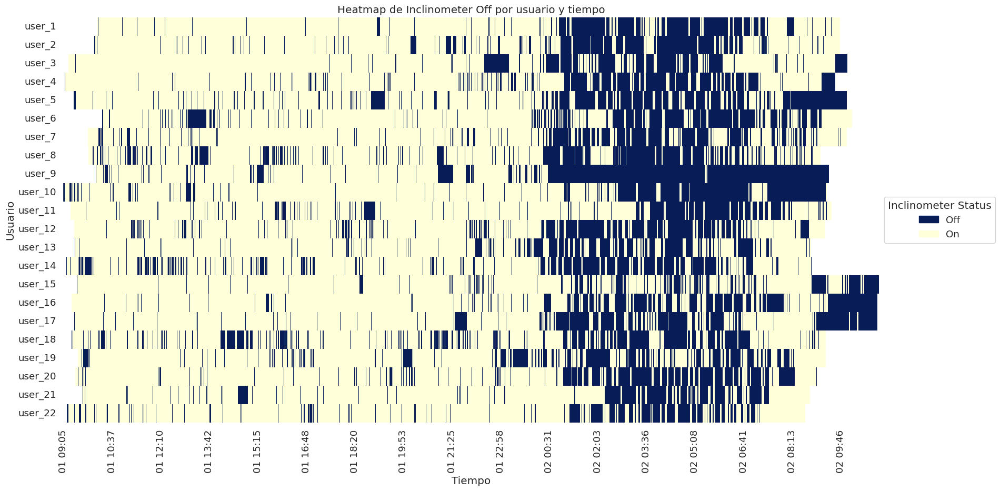

In [94]:
# Configuración de estilo para seaborn
sns.set_style("white")
sns.set_context("notebook", font_scale=1.2)

# Crear la figura y el eje
fig, ax = plt.subplots(figsize=(20, 10))

# Copiar el dataframe con las columnas necesarias
df_heatmap = df_inclinometer_imputed[['User', 'Inclinometer Off', 'datetime']].copy()

# Pivotar el dataframe para crear una matriz con usuarios como filas y tiempo como columnas
df_heatmap_pivot = df_heatmap.pivot(index='User', columns='datetime', values='Inclinometer Off')

# Ordenar por el número de usuario detrás de _
df_heatmap_pivot.sort_index(key=lambda x: x.str.split('_').str[1].astype(int), inplace=True)

# Formatear el índice de tiempo para mostrar solo el día y la hora (HH:MM)
df_heatmap_pivot.columns = df_heatmap_pivot.columns.strftime('%d %H:%M')

# Crear el heatmap
sns.heatmap(df_heatmap_pivot, cmap='YlGnBu', cbar=False, ax=ax)
ax.set_title('Heatmap de Inclinometer Off por usuario y tiempo')
ax.set_xlabel('Tiempo')
ax.set_ylabel('Usuario')

# Establece saltos en las etiquetas del eje X para no mostrar tantas en el gráfico
n = 5
for i, label in enumerate(ax.get_xticklabels()):
    if i % n != 0:
        label.set_visible(False)

# Se crea una leyenda fuera del gráfico
colors = {'Off': '#081d58', 'On': '#ffffd9'}
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5), title='Inclinometer Status')

plt.show()

Se plotea el mismo gráfico anterior pero con un color distinto para cada valor del inclinómetro tras la imputación de los datos. Para ello, se deshace el one-hot encoding y se crea una nueva columna con el valor de la posición del inclinómetro.

In [95]:
# Se deshace el one-hot encoding de las columnas Inclinometer Off, Standing, Sitting y Lying
df_inclinometer_cat = df_inclinometer_imputed.copy()
df_inclinometer_cat['Inclinometer_status'] = df_inclinometer_imputed[['Inclinometer Off', 'Inclinometer Standing', 'Inclinometer Sitting', 'Inclinometer Lying']].idxmax(axis=1)

# Cambiamos los niveles de las categorías a español
df_inclinometer_cat['Inclinometer_status'] = df_inclinometer_cat['Inclinometer_status'].replace({
    'Inclinometer Off': 'Apagado',
    'Inclinometer Standing': 'De pie',
    'Inclinometer Sitting': 'Sentado',
    'Inclinometer Lying': 'Tumbado'
})

display(df_inclinometer_cat)

,datetime,Inclinometer Off,Inclinometer Standing,Inclinometer Sitting,Inclinometer Lying,User,Inclinometer_status
0,1900-01-01 10:10:22,0,1,0,0,user_1,De pie
1,1900-01-01 10:10:23,0,1,0,0,user_1,De pie
2,1900-01-01 10:10:24,0,0,1,0,user_1,Sentado
3,1900-01-01 10:10:25,0,0,1,0,user_1,Sentado
4,1900-01-01 10:10:26,0,1,0,0,user_1,De pie
...,...,...,...,...,...,...,...
1905660,1900-01-02 09:24:29,1,0,0,0,user_9,Apagado
1905661,1900-01-02 09:24:30,1,0,0,0,user_9,Apagado
1905662,1900-01-02 09:24:31,1,0,0,0,user_9,Apagado
1905663,1900-01-02 09:24:32,1,0,0,0,user_9,Apagado


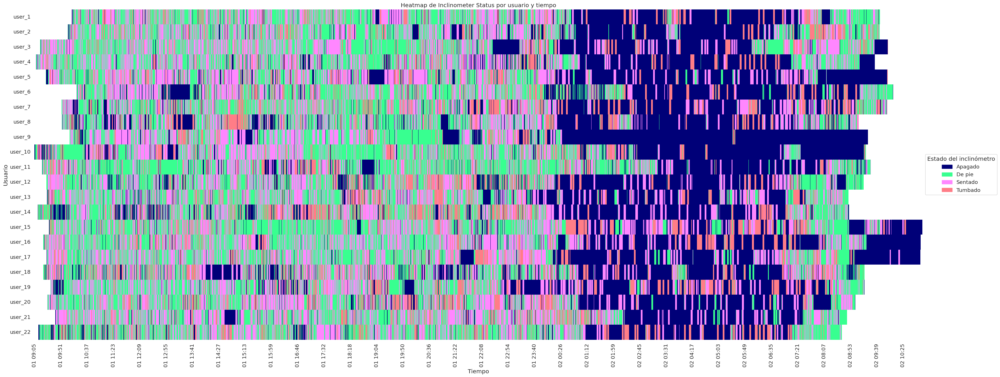

In [96]:
# Configuración de estilo para seaborn
sns.set_style("white")
sns.set_context("notebook", font_scale=1.2)

# Crear la figura y el eje
fig, ax = plt.subplots(figsize=(40, 15))

# Copiar el dataframe con las columnas necesarias
df_heatmap = df_inclinometer_cat[['User', 'Inclinometer_status', 'datetime']].copy()

# Convertir los valores de 'Inclinometer_status' a numéricos
status_mapping = {'Apagado': 0, 'De pie': 1, 'Sentado': 2, 'Tumbado': 3}
df_heatmap['Inclinometer_status'] = df_heatmap['Inclinometer_status'].map(status_mapping)

# Pivotar el dataframe para crear una matriz con usuarios como filas y tiempo como columnas
df_heatmap_pivot = df_heatmap.pivot(index='User', columns='datetime', values='Inclinometer_status')

# Ordenar por el número de usuario detrás de _
df_heatmap_pivot.sort_index(key=lambda x: x.str.split('_').str[1].astype(int), inplace=True)

# Se definen los colores para cada categoría con un diccionario
colors = {0: '#000078', 1: '#38FF90', 2: '#FF87FF', 3: '#FF7D87'}
cmap = ListedColormap([colors[key] for key in sorted(colors.keys())])

# Formatear el índice de tiempo para mostrar solo el día y la hora (HH:MM)
df_heatmap_pivot.columns = df_heatmap_pivot.columns.strftime('%d %H:%M')

# Crear el heatmap
sns.heatmap(df_heatmap_pivot, cmap=cmap, cbar=False, ax=ax)
ax.set_title('Heatmap de Inclinometer Status por usuario y tiempo')
ax.set_xlabel('Tiempo')
ax.set_ylabel('Usuario')

# Establece saltos en las etiquetas del eje X para no mostrar tantas en el gráfico
n = 5
for i, label in enumerate(ax.get_xticklabels()):
    if i % n != 0:
        label.set_visible(False)

# Se crea una leyenda fuera del gráfico
labels = ['Apagado', 'De pie', 'Sentado', 'Tumbado']
handles = [plt.Rectangle((0,0),1,1, color=colors[status_mapping[label]]) for label in labels]
ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5), title='Estado del inclinómetro')

plt.show()

Se calcula un stacked barplot relativo con la frecuencia de los estados del inclinómetro por usuario.

/tmp/ipykernel_11176/3624370032.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f'{int(tick)}%' for tick in ax.get_yticks()])
/tmp/ipykernel_11176/3624370032.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')


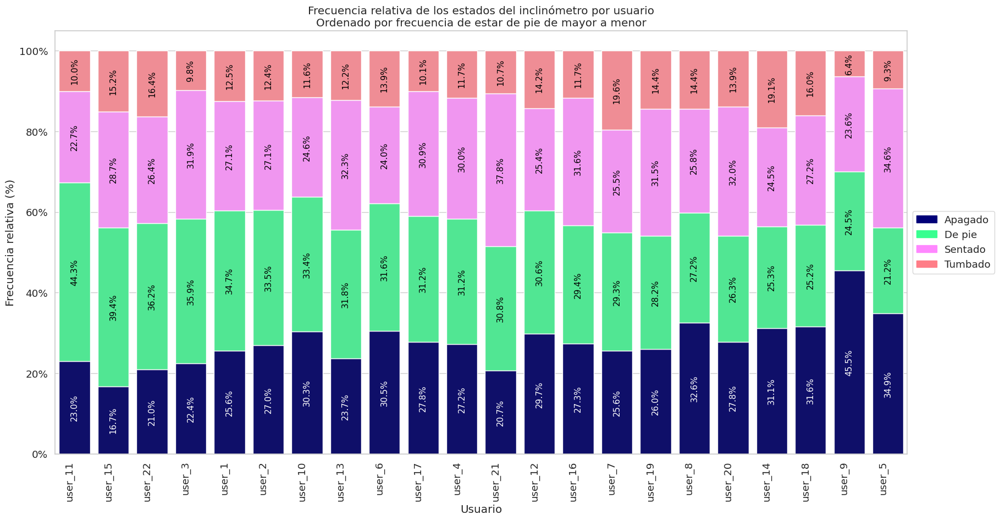

In [97]:
# Se calcula la frecuencia de los estados del inclinómetro por usuario
frecuencia_inclinometro = df_inclinometer_cat.groupby(['User', 'Inclinometer_status']).size().unstack().fillna(0)

# Se calcula la frecuencia relativa y se multiplica por 100 para obtener el porcentaje
frecuencia_inclinometro_relativa = frecuencia_inclinometro.div(frecuencia_inclinometro.sum(axis=1), axis=0)
frecuencia_inclinometro_relativa *= 100

# Se ordena en orden descendiente por el estado 'De pie'
frecuencia_inclinometro_relativa.sort_values('De pie', ascending=False, inplace=True)

# Se configura el estilo
sns.set_style("whitegrid")

# Se crea el gráfico de barras apiladas relativo
fig, ax = plt.subplots(figsize=(20, 10))

# Colores para cada estado del inclinómetro
colors = ['#000078', '#38FF90', '#FF87FF', '#FF7D87']

# Bar chart 1 -> top bars (Apagado)
bar1 = sns.barplot(x=frecuencia_inclinometro_relativa.index, y=frecuencia_inclinometro_relativa['Apagado'], color=colors[0], ax=ax)

# Bar chart 2 -> second bars (De pie)
bottom = frecuencia_inclinometro_relativa['Apagado']
bar2 = sns.barplot(x=frecuencia_inclinometro_relativa.index, y=frecuencia_inclinometro_relativa['De pie'], bottom=bottom, color=colors[1], ax=ax)

# Bar chart 3 -> third bars (Sentado)
bottom += frecuencia_inclinometro_relativa['De pie']
bar3 = sns.barplot(x=frecuencia_inclinometro_relativa.index, y=frecuencia_inclinometro_relativa['Sentado'], bottom=bottom, color=colors[2], ax=ax)

# Bar chart 4 -> bottom bars (Tumbado)
bottom += frecuencia_inclinometro_relativa['Sentado']
bar4 = sns.barplot(x=frecuencia_inclinometro_relativa.index, y=frecuencia_inclinometro_relativa['Tumbado'], bottom=bottom, color=colors[3], ax=ax)

# Añadir leyenda fuera a la derecha de la gráfica
top_bar = mpatches.Patch(color=colors[0], label='Apagado')
second_bar = mpatches.Patch(color=colors[1], label='De pie')
third_bar = mpatches.Patch(color=colors[2], label='Sentado')
bottom_bar = mpatches.Patch(color=colors[3], label='Tumbado')
plt.legend(handles=[top_bar, second_bar, third_bar, bottom_bar], loc='center left', bbox_to_anchor=(1, 0.5))

# Configurar etiquetas y título
ax.set_xlabel('Usuario')
ax.set_ylabel('Frecuencia relativa (%)')
ax.set_title('Frecuencia relativa de los estados del inclinómetro por usuario')
ax.set_title('Frecuencia relativa de los estados del inclinómetro por usuario\nOrdenado por frecuencia de estar de pie de mayor a menor')

# Añadir el símbolo de porcentaje a las etiquetas del eje y
ax.set_yticklabels([f'{int(tick)}%' for tick in ax.get_yticks()])

# Rotar las etiquetas del eje x
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

# Añade un texto encima de cada barra con su porcentaje girado 90º
for p in ax.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    text_size = 11
    if p.get_y() == 0:
        ax.text(x + width/2, y + height/2, f'{height:.1f}%', color='white', ha='center', va='center', rotation=90, fontsize=text_size)
    else:
        ax.text(x + width/2, y + height/2, f'{height:.1f}%', color='black', ha='center', va='center', rotation=90, fontsize=text_size)
plt.show()

En el gráfico observamos varios aspectos interesantes:

- Hay usuarios como el *user_9* que tienen en torno a un 45.5% del tiempo el inclinómetro apagado. Esto puede estar relacionado con la cantidad de tiempo que pasa este usuario dormido.
- Hay diferencias de casi el doble entre los usuarios que pasan más tiempo de pie y los que pasan menos. Los que más tiempo pasan de pie son el *user_11* y el *user_15*, y los que menos son el *user_9* y el *user_5* (siempre en términos relativos).
- El registro más frecuente es estar de pie, con una proporción de tiempo por usuario muy similar, aunque algo menor que estar sentado. A estos les sigue el estar apagado y, con un valor mucho menor, el estar tumbado.
- La proporción es aproximadamente de un 30% estar de pie, un 30% estar sentado, un 30% estar apagado y un 10% estar tumbado.

**HR**

Hear rate es una variable que se mide en latidos por minuto (bpm). Es una variable que puede variar mucho en función de la actividad física que se esté realizando. Los valores normales oscilan entre 60 y 100 bpm en reposo. Pudiendo tener valores de en torno a 40 bpm en deportistas de élite y alcanzando valores de 220 bpm en actividades de alta intensidad.

In [98]:
# Se muestran los descriptivos estadísticos de los datos de HR
display(df_actigraph['HR'].describe().to_frame().T)

,count,mean,std,min,25%,50%,75%,max
HR,1462678.000,75.515,17.714,3.000,63.000,73.000,85.000,251.000


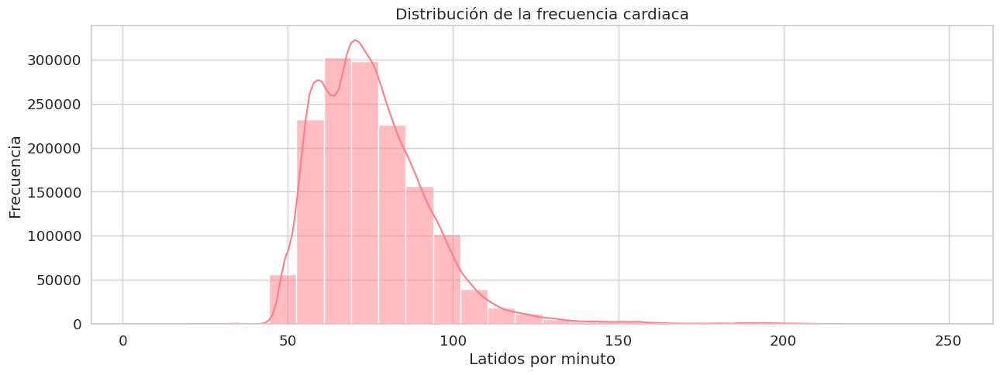

In [99]:
# Se muestra la distribución de los HR con un histograma

sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(15, 5))

# Crear el histograma
sns.histplot(df_actigraph['HR'], bins=30, color='#FF7D87',  kde=True, ax=ax)
ax.set_xlabel('Latidos por minuto')
ax.set_ylabel('Frecuencia')
ax.set_title('Distribución de la frecuencia cardiaca')

plt.show()

Se muestra una distribución con 2 picos, uno alrededor de 65 (algo más bajo) y otro alrededor de 75 (algo más alto). Esto puede deberse a que hay dos grupos de personas con diferentes niveles de actividad física, o bien a que hay dos momentos del día en los que la frecuencia cardiaca es diferente. La gráfica muestra una distribución bimodal sesgada a la derecha. También se observa que hay valores muy extremos en la parte inferior (cercanos a 0) y superior (cercanos a 250) de la distribución. Se mostrarán estos outliers con un violin plot y un boxplot.

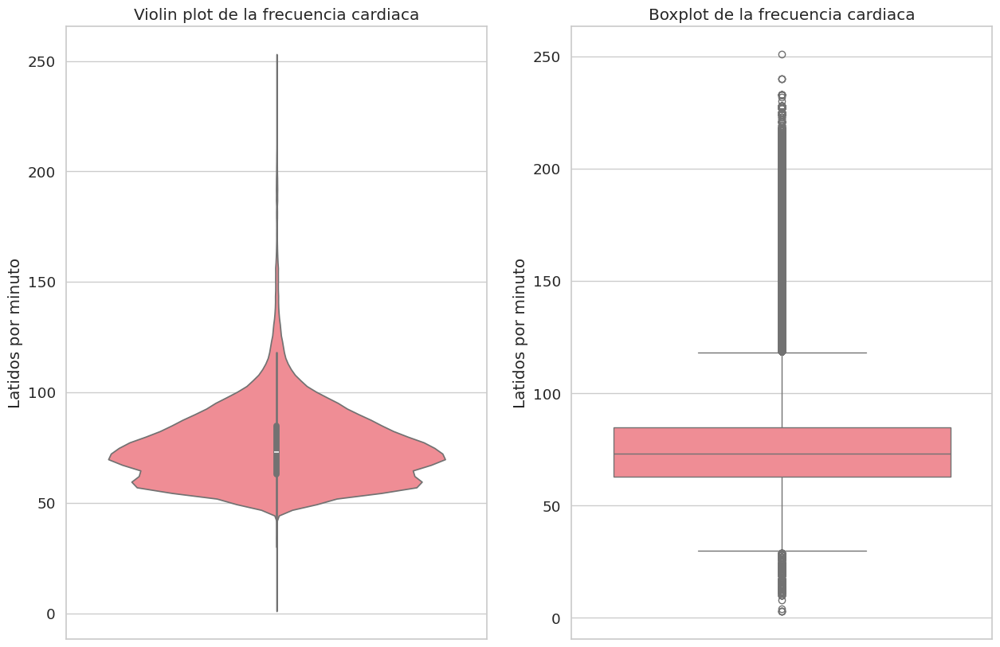

In [100]:
# Creamos un violin plot y un gráfico de caja-bigote para mostrar los outliers
sns.set_style("whitegrid")

fig, axs = plt.subplots(1, 2, figsize=(15, 10))

# Violin plot
sns.violinplot(data=df_actigraph, y='HR', color='#FF7D87', ax=axs[0])
axs[0].set_ylabel('Latidos por minuto')
axs[0].set_title('Violin plot de la frecuencia cardiaca')

# Boxplot
sns.boxplot(data=df_actigraph, y='HR', color='#FF7D87', ax=axs[1])
axs[1].set_ylabel('Latidos por minuto')
axs[1].set_title('Boxplot de la frecuencia cardiaca')

plt.show()

Se observa que, por debajo de valores inferiores a 45 latidos por minuto, se encuentran valores muy poco frecuentes. Por encima de la distribución, se encuentra una cola más progresiva. Se puede ver que, a partir de valores superiores a 170 latidos por minuto, se encuentran valores poco frecuentes. Si se tratara de valores independientes, se podría proceder a establecer un umbral para imputar los valores que se encuentran por debajo de 45 y por encima de 170. Sin embargo, al tratarse de datos temporales, se procederá a imputar estos valores con técnicas de media móvil. Para ello, se comenzará visualizando las series temporales de HR por usuario antes de procesarlas. Esto permitirá determinar si estos valores extremos son puntuales debido a errores en la medición o si son constantes en un periodo de tiempo.

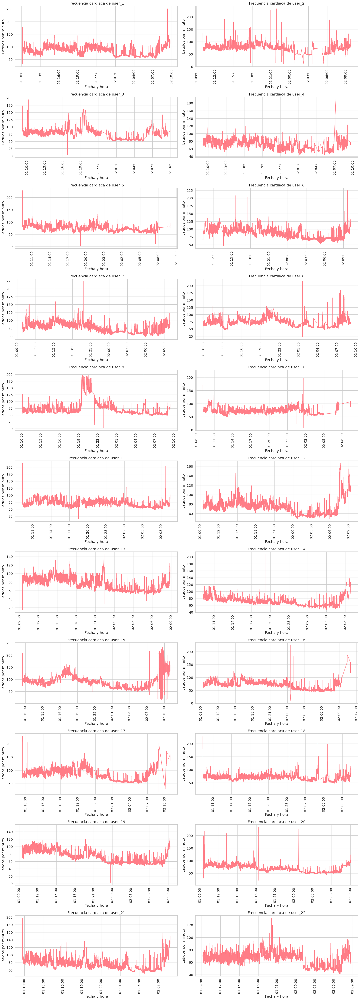

In [101]:
# Se muestra la serie temporal de HR por usuario con 2 columnas y tantas filas como sea necesario
n_cols = 2
n_rows = int(np.ceil(len(users_list) / n_cols))

fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))

# Se itera sobre los usuarios y se plotea la información
for idx, user in enumerate(users_list):
    df_user = df_actigraph[df_actigraph['User'] == user]
    ax = axs[idx // n_cols, idx % n_cols]
    ax.plot(df_user['datetime'], df_user['HR'], color='#FF7D87')
    ax.set_title(f'Frecuencia cardiaca de {user}')
    ax.set_ylabel('Latidos por minuto')
    ax.set_xlabel('Fecha y hora')
    ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%d %H:%M'))
    ax.xaxis.set_major_locator(plt.matplotlib.dates.HourLocator(interval=3))
    for label in ax.get_xticklabels():
        label.set_rotation(90)

plt.tight_layout()
plt.show()

Se observa que hay picos en la frecuencia cardíaca que no corresponden con los patrones normales. En 1 segundo no se produce un cambio de 60 a 120 latidos por minuto y después volver a 60. Por lo que se ve necesario realizar la media móvil con una ventana de tiempo para suavizar la señal.

In [102]:
def media_movil_hr(df_usuario, ventana_temporal, n_iter):
    """
    Esta función calcula la media móvil de la frecuencia cardiaca de un usuario.
    Emplea una ventana temporal para calcular la media móvil.
    
    Args:
    df_usuario (pd.DataFrame): DataFrame con los datos de un usuario.
    ventana_temporal (pd.Timedelta): Ventana temporal para calcular la media móvil.
    n_iter (int): Número de iteraciones para calcular la media móvil.

    Returns:
    pd.DataFrame: DataFrame con la media móvil de la frecuencia cardiaca.
    """
    df_usuario.set_index('datetime', inplace=True)

    # Se calcula la media móvil de la frecuencia cardiaca
    for _ in range(n_iter):
        df_usuario['HR'] = df_usuario['HR'].rolling(window=ventana_temporal, min_periods=1, center=True).mean()

    df_usuario.reset_index(inplace=True)

    return df_usuario


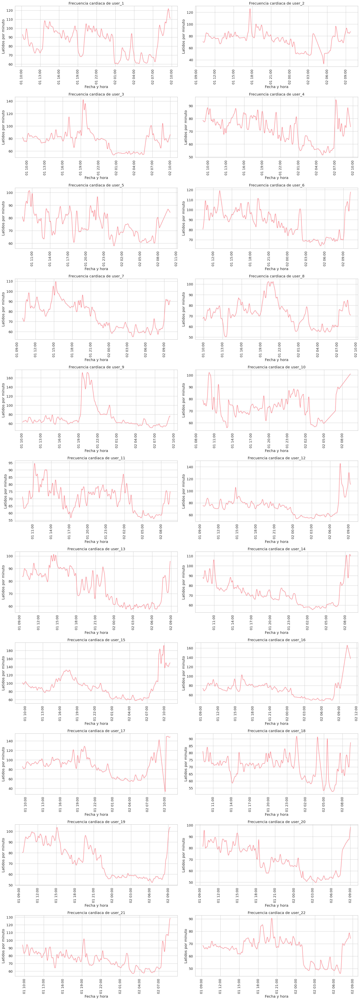

In [103]:
# Se calcula la media movil para cada usuario y se sustituyen los valores originales
for user in users_list:
    df_user = df_actigraph[df_actigraph['User'] == user]
    df_user_mm = media_movil_hr(df_user, pd.Timedelta(minutes=10), 3)
    df_actigraph.loc[df_actigraph['User'] == user, 'HR'] = df_user_mm['HR'].values

# Se muestra la serie temporal de HR por usuario con 2 columnas y tantas filas como sea necesario
n_cols = 2
n_rows = int(np.ceil(len(users_list) / n_cols))

fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))

for idx, user in enumerate(users_list):
    df_user = df_actigraph[df_actigraph['User'] == user]
    ax = axs[idx // n_cols, idx % n_cols]
    ax.plot(df_user['datetime'], df_user['HR'], color='#FF7D87')
    ax.set_title(f'Frecuencia cardiaca de {user}')
    ax.set_ylabel('Latidos por minuto')
    ax.set_xlabel('Fecha y hora')
    ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%d %H:%M'))
    ax.xaxis.set_major_locator(plt.matplotlib.dates.HourLocator(interval=3))
    for label in ax.get_xticklabels():
        label.set_rotation(90)

plt.tight_layout()
plt.show()

En los gráficos se advierte que hay usuarios con una mayor variabilidad en la frecuencia cardiaca. Esto puede ser debido a que estos usuarios han realizado más actividad física o han tenido más estrés. Otros usuarios presentan una frecuencia cardiaca más estable, sin embargo en general se observa una tendencia de una frecuencia cardiaca más baja durante la noche del primer al segundo día.

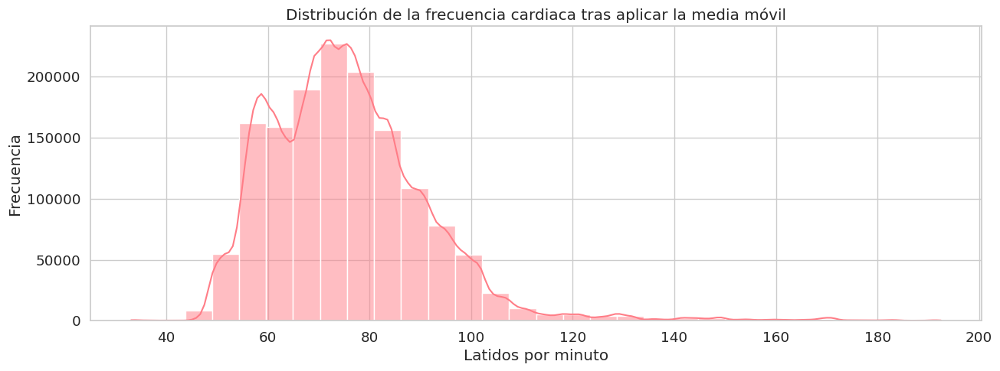

In [105]:
# Se muestra el histograma de la frecuencia cardiaca tras aplicar la media móvil
sns.set_style("whitegrid")

fig, ax = plt.subplots(figsize=(15, 5))

# Crear el histograma
sns.histplot(df_actigraph['HR'], bins=30, color='#FF7D87', kde=True, ax=ax)
ax.set_xlabel('Latidos por minuto')
ax.set_ylabel('Frecuencia')
ax.set_title('Distribución de la frecuencia cardiaca tras aplicar la media móvil')

plt.show()

Se sige observando una distribución similar a la original, pero con menos variabilidad en los valores extremos. Los outliers ahora son valores más realistas y no tan inverosímiles. Se sigue observando una distribución sesgada a la derecha, pero con una cola menos pronunciada. Además sige siendo una distribución bimodal,lo que sigue indicando que hay dos grupos de personas en el estudio o bien que hay dos momentos del día en los que la frecuencia cardiaca es diferente (noche y día, por ejemplo).

# 2. Guardamos el dataframe como un fichero pickle

In [104]:
# Se establece el nombre del archivo 
out_folder = os.path.join('..', '0_data', "clean_MMASH")

filename1 = os.path.join(out_folder, 'actigraph_clean.pkl')
filename2 = os.path.join(out_folder, 'steps_clean.pkl')
filename3 = os.path.join(out_folder, 'steps_interval_clean.pkl')
filename4 = os.path.join(out_folder, 'inclinometer_clean.pkl')

# Comprobamos si la carpeta existe, si no la creamos
if not os.path.exists(out_folder):
    os.makedirs(out_folder)

# Comprobamos si el archivo 1 existe, de ser así lo eliminamos
if os.path.exists(filename1):
    os.remove(filename1)

# Comprobamos si el archivo 2 existe, de ser así lo eliminamos
if os.path.exists(filename2):
    os.remove(filename2)

# Comprobamos si el archivo 3 existe, de ser así lo eliminamos
if os.path.exists(filename3):
    os.remove(filename3)

# Comprobamos si el archivo 4 existe, de ser así lo eliminamos
if os.path.exists(filename4):
    os.remove(filename4)

## Guardamos los DataFrames en archivos pickle
df_actigraph.to_pickle(filename1)
df_steps_user.to_pickle(filename2)
df_user_steps_interval.to_pickle(filename3)
df_inclinometer_imputed.to_pickle(filename4)

El dataframe inclinometer_inputed se ha guardado previamente en un archivo pickle. Ya que el proceso de imputación es costoso en tiempo y recursos, se ha decidido guardar el resultado para poder cargarlo en futuras ocasiones sin necesidad de volver a realizar el proceso de imputación.

# Bibliografía

[1] Rossi, A., Da Pozzo, E., Menicagli, D., Tremolanti, C., Priami, C., Sirbu, A., Clifton, D., Martini, C., & Morelli, D. (n.d.). Multilevel Monitoring of Activity and Sleep in Healthy people (Version 1.0.0) [Dataset]. PhysioNet. https://doi.org/10.13026/CERQ-FC86

[2] Rossi, A., Da Pozzo, E., Menicagli, D., Tremolanti, C., Priami, C., Sîrbu, A., Clifton, D. A., Martini, C., & Morelli, D. (2020). A Public Dataset of 24-h Multi-Levels Psycho-Physiological Responses in Young Healthy Adults. Data, 5(4), Article 4. https://doi.org/10.3390/data5040091
